In [1]:
import shelve
import io
#import gdbm
#mod = __import__('gdbm')
import dumbdbm
import pandas as pd
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn import datasets, decomposition
import numpy as np
import gc
from datetime import datetime
import datetime as dt
#datetime.strptime('2016-03-29','%Y-%d-%m')
import dateparser
from ipykernel import kernelapp as app
import csv
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from operator import itemgetter
import folium
from folium.plugins import HeatMap
import Instalib as IL
import Instaplot as IP
import math
import re
import string
import emoji
import pickle
import scipy.io
from sklearn.feature_extraction.text import CountVectorizer
import nltk.stem
import sktensor
import geopy.distance
from itertools import groupby
import ncp
from datetime import timedelta
from dateutil.relativedelta import *
import os
from nltk.corpus import stopwords
from nltk.stem.snowball import FrenchStemmer
import nltk.data #
nltk.download('punkt')
from nltk.stem.snowball import FrenchStemmer
italian_stemmer = nltk.stem.SnowballStemmer('italian')
english_stemmer = nltk.stem.SnowballStemmer('english')
from langdetect import detect
from langdetect.lang_detect_exception import LangDetectException
import langid
langid.set_languages(['it', 'en'])  # ISO 639-1 codes
import time
import datetime
import geopandas
import shapely
from shapely.geometry import Point

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
2019-03-11 10:26:55,642 : INFO : initializing identifier


# Open the file and have a first look

Read the data and concatenate in a single DataFrame file, basic file format for pandas. It's a 2-D object, tabular file with labeled rows and columns, built from a dictionary or such. 

More info about it here: https://pandas.pydata.org/pandas-docs/stable/10min.html

Make our life easier by matching the Torino labels with the Marseille ones and convert strings to datetime

In [3]:
df_new=pd.read_csv('Torino_data/torino_posts.csv',lineterminator='\n')
df_new=df_new.rename(columns = {'caption':'text','taken_at_timestamp':'date'})
df_new.head()

,date,text,location_id
0,2017-11-14 16:20:42,After great week to home of my Friend this sac...,135250610358325
1,2017-10-31 16:10:00,Fisrt Flower of my new style.. thanx Teresa.. ...,135250610358325
2,2017-10-16 15:22:37,This for new roses!! Thanx Simone!!#walterbian...,135250610358325
3,2017-10-05 15:40:03,New skull !! #walterbianco_wb #wbtattooartgall...,135250610358325
4,2017-10-03 16:13:43,Paint acrilic biomech on sale 40cm X 30 cm o...,135250610358325


In [4]:
list_dates, Histo = IL.N_posts(df_new, debug=False)
Npostslog=[np.log10(H) for H in Histo]
Nposts=[H for H in Histo]

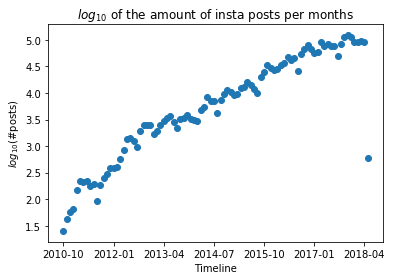

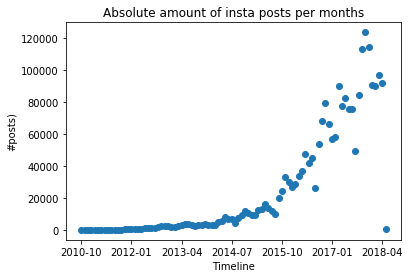

In [5]:
if 'Figures' not in os.listdir('.') and False:
    os.mkdir('Figures')
    os.mkdir('Figures/Shape')
    os.mkdir('Figures/Shape/Spatial')
    os.mkdir('Figures/Shape/Temporal')
plt.figure()
plt.scatter(list_dates, Npostslog)
plt.xticks(list_dates[0::15])
plt.ylabel(r'$log_{10}$(#posts)')
plt.xlabel('Timeline')
plt.title(r'$log_{10}$ of the amount of insta posts per months')
#plt.savefig('Figures/Shape/Temporal/Torino_logN.pdf')
plt.show()
plt.figure()
plt.scatter(list_dates, Nposts)
plt.xticks(list_dates[0::15])
plt.ylabel('#posts)')
plt.xlabel('Timeline')
plt.title('Absolute amount of insta posts per months')
#plt.savefig('Figures/Shape/Temporal/Torino_N.pdf')
plt.show()

In [6]:
df_location_all=pd.read_csv('Torino_data/torino_locations.csv', lineterminator='\n')
df_location_all=df_location_all.rename(columns = {'latitude':'lat','longitude':'lon', 'location_id':'id'})
df_location_all.head()

,id,name,lat,lon
0,135250610358325,WB Tattoos Art Gallery,45.072270,7.693010
1,346586842349479,InQubatore Qulturale,45.133572,7.631137
2,328277161003275,Mixed By Luca Pain,45.081999,7.661826
3,1022295605,06565,45.063780,7.681740
4,127109984575725,Café Müller,45.061100,7.676030


In [7]:
#remember zip:
zip([1,2,3],['a','b','c'])
#it's a function.
#make a new column 'coord' indexing (lat,lon) for each post
df_location_all['coord'] = list(zip(df_location_all.lat,df_location_all.lon))
df_location_all.head()

,id,name,lat,lon,coord
0,135250610358325,WB Tattoos Art Gallery,45.072270,7.693010,"(45.07227, 7.69301)"
1,346586842349479,InQubatore Qulturale,45.133572,7.631137,"(45.1335721884, 7.631136775)"
2,328277161003275,Mixed By Luca Pain,45.081999,7.661826,"(45.081999413, 7.6618255282)"
3,1022295605,06565,45.063780,7.681740,"(45.06378, 7.68174)"
4,127109984575725,Café Müller,45.061100,7.676030,"(45.0611, 7.67603)"


# Let's refine the DataFrame

In [8]:
#link postID with its location
dict_id_coord= dict(zip(df_location_all.id,df_location_all.coord))
dict_id_name= dict(zip(df_location_all.id,df_location_all.name))
dict_coord_name= dict(zip(df_location_all.coord,df_location_all.name))

series.map() matches corresponding entries from two different series files. This is what x.map(y) does:

In [26]:
x = pd.Series([1,2,3], index=['one', 'two', 'three'])
x

one      1
two      2
three    3
dtype: int64

In [27]:
y = pd.Series(['foo', 'bar', 'baz'], index=[1,2,3])
y

1    foo
2    bar
3    baz
dtype: object

In [20]:
x.map(y)

one      foo
two      bar
three    baz
dtype: object

In [24]:
z = pd.Series(['foo', 'bar', 'baz'], index=[3,1,2])
z

3    foo
1    bar
2    baz
dtype: object

In [25]:
x.map(z)

one      bar
two      baz
three    foo
dtype: object

In [9]:
#Adding a column 'coords' by mapping the coordinates to their location_id:
df_new['coords'] = df_new['location_id'].map(dict_id_coord)
# And a column 'name' by mapping the location ids to their associate name.
df_new['name'] = df_new['location_id'].map(dict_id_name)

#Create lat and lon columns by reading coords
# Look here: https://pythonhow.com/accessing-dataframe-columns-rows-and-cells/
df_new['lat']=[e[0] for e in df_new.loc[:,'coords']]
df_new['lon']=[e[1] for e in df_new.loc[:,'coords']]

# Drop duplicates
df_new.drop_duplicates(keep='first')
df_new.head()
#needs to be done at the end for compatibility reasons
# learn how to parse time here: https://www.tutorialspoint.com/python/time_strptime.htm

df_new['date']=[datetime.datetime.strptime(t,'%Y-%m-%d %H:%M:%S') for t in list(df_new['date'])]

In [10]:
df_new.dtypes

date           datetime64[ns]
text                   object
location_id             int64
coords                 object
name                   object
lat                   float64
lon                   float64
dtype: object

### Checkpoint 1

In [13]:
pickle.dump(df_new, open('PKL_files/df24_new_chkpt1.pkl', 'wb'))

Build the frame and the grid. $$x_{min/max}=longitude_{min/max}$$ and conversely for y and latitude.

In [12]:

# Attention problème d'arrondi lors du passage de Coord à (lat,lon)
step_m=0.5
lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)
print (number_lats, number_lon)


(31.00000000000114, 31.000000000000007)


### Checkpoint 2

In [18]:
#pickle.dump(df_new, open('PKL_files/df24_new_chkpt2.pkl', 'wb'))
#df_new=pd.read_pickle('PKL_files/df24_new_chkpt1.pkl')

In [19]:
df_new.text.tolist()[0]

'After great week to home of my Friend this sacred sleeve!! Thanx Marcus . Thanx for watch#walterbianco_wb #wbtattoos #wbtattooart #tattoo #sleevetattoo #rose #clouds #tatuaggio #iltatuaggio #tattooenergie #tattoolife #tattoomagazine #sacredhearttattoo #blackandwhite ndgraytattoo#italiantattooartist #torino #labellatorino #vanchiglia #instagram #instaart #instatattoo #tatuajes #tatuaje #tatuatori #tatuatoritorino #'

# Time to clean the text

But first make a copy before we do anything stupid

In [41]:
df_new_save=df_new.copy()
#df_new=df_new_save.copy()

In [25]:
df_new=IL.text_processing(df_new)
#df_new=df_new[['date','lat','lon','latbin','lonbin','coords','text_new','name']]
df_new.drop(['text'],axis=1,inplace=True)
df_new=df_new.rename(columns = {'text_new':'text'})
df_new['coordsbin'] = list(zip(df_new.latbin,df_new.lonbin))
#print len(df_new_save.text.tolist()) - len(df_new.text.tolist()), 'posts deleted in the process'
df_new.head()

,date,location_id,coords,name,lat,lon,latbin,lonbin,text,coordsbin
0,2017-11-14 16:20:42,135250610358325,"(45.07227, 7.69301)",WB Tattoos Art Gallery,45.07227,7.69301,45.072,7.691152,After great week to home of my Friend this sac...,"(45.072, 7.69115211839)"
1,2017-10-31 16:10:00,135250610358325,"(45.07227, 7.69301)",WB Tattoos Art Gallery,45.07227,7.69301,45.072,7.691152,Fisrt Flower of my new style thanx Teresa than...,"(45.072, 7.69115211839)"
2,2017-10-16 15:22:37,135250610358325,"(45.07227, 7.69301)",WB Tattoos Art Gallery,45.07227,7.69301,45.072,7.691152,This for new roses Thanx Simonewalterbiancowb ...,"(45.072, 7.69115211839)"
3,2017-10-05 15:40:03,135250610358325,"(45.07227, 7.69301)",WB Tattoos Art Gallery,45.07227,7.69301,45.072,7.691152,New skull walterbiancowb wbtattooartgallery w...,"(45.072, 7.69115211839)"
4,2017-10-03 16:13:43,135250610358325,"(45.07227, 7.69301)",WB Tattoos Art Gallery,45.07227,7.69301,45.072,7.691152,Paint acrilic biomech on sale cm X cm original...,"(45.072, 7.69115211839)"


### Checkpoint 3

In [20]:
#And pickle it
#df_new.to_pickle('PKL_files/df24_new_chkpt3.pkl')
df_new=pd.read_pickle('PKL_files/df24_new_chkpt3.pkl')

In [22]:
if True:
    #In case I'm not loading this since the beginning
    dict_coord_name= dict(zip(df_new.coords,df_new.name))
    dict_name_coord= dict(zip(df_new.name,df_new.coords))
    step_m=0.5
    lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
    number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)

Learn about how groupby does not returns a dataframe but only groups the data IN ORDER TO APPLY SOME FUNCTION to it here: https://pandas.pydata.org/pandas-docs/stable/groupby.html

In [23]:
df_new_index,df_new_nodup2=IL.indexed_dataframe(df_new,step_lon,step_lat,number_lats)

How many spots? 5818


In [27]:
print len(set(df_new.coords.tolist())), 'different coords in the dataset'
print len(set(df_new.coordsbin.tolist())), 'different bins in the dataset'

5818 different coords in the dataset
518 different bins in the dataset


In [24]:
df_new_index=df_new[['date','text','coordsbin']]

In [25]:
df_new_index['year_month'] = list(zip(df_new_index['date'].dt.year, df_new_index['date'].dt.month))

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [26]:
#Make an index of only the years + months and text of posts
df_new_index=df_new[['date','text','coordsbin']]
df_new_index['date'] = pd.to_datetime(df_new_index['date'], errors='coerce')
df_new_index['year_month'] = list(zip(df_new_index['date'].dt.year, df_new_index['date'].dt.month)) #add a month column
yearmin = min([y[0] for y in df_new_index.year_month.tolist()])

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [27]:
print df_new_index.shape
print len(df_new_index.text.tolist()), 'posts in df_new_index'
print 'among which',len(set(df_new_index.text.tolist())), 'are unique'

(2036950, 4)
2036950 posts in df_new_index
among which 1869419 are unique


### Checkpoint 4

In [29]:
year=2012
for year in range(2013,2019):
    df_year=df_new_index[df_new_index.date>datetime.datetime(year,1,1)]
    df_year=df_year[df_year.date<datetime.datetime(year+1,1,1)]
    df_year['weekday']=df_year.date.apply(lambda x : x.weekday())
    #0 is monday, 6 in Sunday
    df_year_week=df_year[df_year.weekday<5]
    df_year_we=df_year[df_year.weekday>=5]
    df_year_week['time']=df_year.date.apply(lambda x : x.time())
    df_year_we['time']=df_year.date.apply(lambda x : x.time())
    start=datetime.datetime(1,1,1,0,0,0)
    stop=datetime.datetime(1,1,2,0,0,0)
    flags=[start]   
    T_delta=relativedelta(minutes=5)
    while flags[-1]+T_delta<stop:
        flags.append(flags[-1]+relativedelta(minutes=15))
    slices=[(f,f+relativedelta(minutes=5)) for f in flags]
    df_year_week2=df_year_week[['text','coordsbin','time']]
    df_year_week2.rename(columns={'time':'date'},inplace=True)
    df_year_week2.date=df_year_week2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))
    df_year_we2=df_year_we[['text','coordsbin','time']]
    df_year_we2.rename(columns={'time':'date'},inplace=True)
    df_year_we2.date=df_year_we2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))
    df_classified=IL.dataframe_classified(slices,df_year_week2)
    df_classified_we=IL.dataframe_classified(slices,df_year_we2)
    df_classified.head()
    df_classified.to_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
    df_classified_we.to_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


0001-01-01 00:00:00 0001-01-01 00:05:00 32
0001-01-01 00:15:00 0001-01-01 00:20:00 33
0001-01-01 00:30:00 0001-01-01 00:35:00 15
0001-01-01 00:45:00 0001-01-01 00:50:00 16


KeyboardInterrupt: 

In [30]:
year=2016
df_year=df_new_index[df_new_index.date>datetime.datetime(year,1,1)]
df_year=df_year[df_year.date<datetime.datetime(year+1,1,1)]
df_year['weekday']=df_year.date.apply(lambda x : x.weekday())
#0 is monday, 6 in Sunday
df_year_week=df_year[df_year.weekday<5]
df_year_we=df_year[df_year.weekday>=5]
df_year_week['time']=df_year.date.apply(lambda x : x.time())
df_year_we['time']=df_year.date.apply(lambda x : x.time())
start=datetime.datetime(1,1,1,0,0,0)
stop=datetime.datetime(1,1,2,0,0,0)
flags=[start]   
T_delta=relativedelta(minutes=5)
while flags[-1]+T_delta<stop:
    flags.append(flags[-1]+relativedelta(minutes=15))
slices=[(f,f+relativedelta(minutes=5)) for f in flags]
df_year_week2=df_year_week[['text','coordsbin','time']]
df_year_week2.rename(columns={'time':'date'},inplace=True)
df_year_week2.date=df_year_week2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))
df_year_we2=df_year_we[['text','coordsbin','time']]
df_year_we2.rename(columns={'time':'date'},inplace=True)
df_year_we2.date=df_year_we2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))
df_classified=IL.dataframe_classified(slices,df_year_week2)
df_classified_we=IL.dataframe_classified(slices,df_year_we2)
df_classified.head()
df_classified.to_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
df_classified_we.to_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


0001-01-01 00:00:00 0001-01-01 00:05:00 532
0001-01-01 00:15:00 0001-01-01 00:20:00 406
0001-01-01 00:30:00 0001-01-01 00:35:00 374
0001-01-01 00:45:00 0001-01-01 00:50:00 270
0001-01-01 01:00:00 0001-01-01 01:05:00 210
0001-01-01 01:15:00 0001-01-01 01:20:00 184
0001-01-01 01:30:00 0001-01-01 01:35:00 172
0001-01-01 01:45:00 0001-01-01 01:50:00 122
0001-01-01 02:00:00 0001-01-01 02:05:00 110
0001-01-01 02:15:00 0001-01-01 02:20:00 75
0001-01-01 02:30:00 0001-01-01 02:35:00 74
0001-01-01 02:45:00 0001-01-01 02:50:00 80
0001-01-01 03:00:00 0001-01-01 03:05:00 55
0001-01-01 03:15:00 0001-01-01 03:20:00 74
0001-01-01 03:30:00 0001-01-01 03:35:00 57
0001-01-01 03:45:00 0001-01-01 03:50:00 67
0001-01-01 04:00:00 0001-01-01 04:05:00 55
0001-01-01 04:15:00 0001-01-01 04:20:00 85
0001-01-01 04:30:00 0001-01-01 04:35:00 73
0001-01-01 04:45:00 0001-01-01 04:50:00 104
0001-01-01 05:00:00 0001-01-01 05:05:00 119
0001-01-01 05:15:00 0001-01-01 05:20:00 159
0001-01-01 05:30:00 0001-01-01 05:35:00 22

0001-01-01 22:00:00 0001-01-01 22:05:00 707
0001-01-01 22:15:00 0001-01-01 22:20:00 688
0001-01-01 22:30:00 0001-01-01 22:35:00 651
0001-01-01 22:45:00 0001-01-01 22:50:00 623
0001-01-01 23:00:00 0001-01-01 23:05:00 548
0001-01-01 23:15:00 0001-01-01 23:20:00 530
0001-01-01 23:30:00 0001-01-01 23:35:00 426
0001-01-01 23:45:00 0001-01-01 23:50:00 407
0001-01-02 00:00:00 0001-01-02 00:05:00 0
ValueError('No objects to concatenate',)


In [ ]:
List_Q=[]
for i in range(n_topics):
    Q_topic=[]
    a=A.T[i]
    b=B.T[i]
    c=C.T[i]
    for v in a,b,c:
        Norm=np.sqrt(sum([u**2 for u in v]))
        Q_topic.append(Norm)
    List_Q.append(np.product(Q_topic))

In [4]:
#And pickle it
#df_new_index.to_pickle('PKL_files/df24_new_index_chkpt4.pkl')
#df_new_index=pd.read_pickle('PKL_files/df24_new_index_chkpt4.pkl')

In [19]:
year=2016
df_year=df_new_index[df_new_index.date>datetime.datetime(year,1,1)]
df_year=df_year[df_year.date<datetime.datetime(year+1,1,1)]
df_year['weekday']=df_year.date.apply(lambda x : x.weekday())

NameError: name 'df_new_index' is not defined

In [19]:
#0 is monday, 6 in Sunday
df_year_week=df_year[df_year.weekday<5]
df_year_we=df_year[df_year.weekday>=5]

In [20]:
#df_year_week.to_pickle('PKL_files/df_year_week_chkpt4.pkl')
#df_year_we.to_pickle('PKL_files/df_year_we_chkpt4.pkl')

In [21]:
df_year_week['time']=df_year.date.apply(lambda x : x.time())
df_year_we['time']=df_year.date.apply(lambda x : x.time())

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [22]:
start=datetime.datetime(1,1,1,0,0,0)
stop=datetime.datetime(1,1,2,0,0,0)
flags=[start]   
T_delta=relativedelta(minutes=5)
while flags[-1]+T_delta<stop:
    flags.append(flags[-1]+relativedelta(minutes=5))
slices=[(f,f+relativedelta(minutes=5)) for f in flags]

In [23]:
df_year_week2=df_year_week[['text','coordsbin','time']]
df_year_week2.rename(columns={'time':'date'},inplace=True)

In [24]:
df_year_week2.date=df_year_week2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))

In [25]:
df_year_we2=df_year_we[['text','coordsbin','time']]
df_year_we2.rename(columns={'time':'date'},inplace=True)
df_year_we2.date=df_year_we2.date.apply(lambda x:datetime.datetime.combine(datetime.date(1,1,1),x))

In [26]:
reload(IL)
df_classified=IL.dataframe_classified(slices,df_year_week2)
df_classified_we=IL.dataframe_classified(slices,df_year_we2)
df_classified.head()

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


0001-01-01 00:00:00 0001-01-01 00:05:00 19
0001-01-01 00:05:00 0001-01-01 00:10:00 12
0001-01-01 00:10:00 0001-01-01 00:15:00 13
0001-01-01 00:15:00 0001-01-01 00:20:00 9
0001-01-01 00:20:00 0001-01-01 00:25:00 10
0001-01-01 00:25:00 0001-01-01 00:30:00 9
0001-01-01 00:30:00 0001-01-01 00:35:00 9
0001-01-01 00:35:00 0001-01-01 00:40:00 9
0001-01-01 00:40:00 0001-01-01 00:45:00 8
0001-01-01 00:45:00 0001-01-01 00:50:00 12
0001-01-01 00:50:00 0001-01-01 00:55:00 15
0001-01-01 00:55:00 0001-01-01 01:00:00 6
0001-01-01 01:00:00 0001-01-01 01:05:00 6
0001-01-01 01:05:00 0001-01-01 01:10:00 5
0001-01-01 01:10:00 0001-01-01 01:15:00 4
0001-01-01 01:15:00 0001-01-01 01:20:00 7
0001-01-01 01:20:00 0001-01-01 01:25:00 3
0001-01-01 01:25:00 0001-01-01 01:30:00 3
0001-01-01 01:30:00 0001-01-01 01:35:00 1
0001-01-01 01:35:00 0001-01-01 01:40:00 4
0001-01-01 01:40:00 0001-01-01 01:45:00 1
0001-01-01 01:45:00 0001-01-01 01:50:00 9
0001-01-01 01:50:00 0001-01-01 01:55:00 3
0001-01-01 01:55:00 0001-01-

0001-01-01 15:45:00 0001-01-01 15:50:00 28
0001-01-01 15:50:00 0001-01-01 15:55:00 43
0001-01-01 15:55:00 0001-01-01 16:00:00 37
0001-01-01 16:00:00 0001-01-01 16:05:00 41
0001-01-01 16:05:00 0001-01-01 16:10:00 42
0001-01-01 16:10:00 0001-01-01 16:15:00 51
0001-01-01 16:15:00 0001-01-01 16:20:00 38
0001-01-01 16:20:00 0001-01-01 16:25:00 57
0001-01-01 16:25:00 0001-01-01 16:30:00 34
0001-01-01 16:30:00 0001-01-01 16:35:00 53
0001-01-01 16:35:00 0001-01-01 16:40:00 56
0001-01-01 16:40:00 0001-01-01 16:45:00 37
0001-01-01 16:45:00 0001-01-01 16:50:00 47
0001-01-01 16:50:00 0001-01-01 16:55:00 38
0001-01-01 16:55:00 0001-01-01 17:00:00 31
0001-01-01 17:00:00 0001-01-01 17:05:00 53
0001-01-01 17:05:00 0001-01-01 17:10:00 43
0001-01-01 17:10:00 0001-01-01 17:15:00 43
0001-01-01 17:15:00 0001-01-01 17:20:00 44
0001-01-01 17:20:00 0001-01-01 17:25:00 40
0001-01-01 17:25:00 0001-01-01 17:30:00 29
0001-01-01 17:30:00 0001-01-01 17:35:00 38
0001-01-01 17:35:00 0001-01-01 17:40:00 43
0001-01-01 

0001-01-01 06:50:00 0001-01-01 06:55:00 2
0001-01-01 06:55:00 0001-01-01 07:00:00 4
0001-01-01 07:00:00 0001-01-01 07:05:00 3
0001-01-01 07:05:00 0001-01-01 07:10:00 3
0001-01-01 07:10:00 0001-01-01 07:15:00 1
0001-01-01 07:15:00 0001-01-01 07:20:00 1
0001-01-01 07:20:00 0001-01-01 07:25:00 3
0001-01-01 07:25:00 0001-01-01 07:30:00 6
0001-01-01 07:30:00 0001-01-01 07:35:00 7
0001-01-01 07:35:00 0001-01-01 07:40:00 3
0001-01-01 07:40:00 0001-01-01 07:45:00 2
0001-01-01 07:45:00 0001-01-01 07:50:00 7
0001-01-01 07:50:00 0001-01-01 07:55:00 7
0001-01-01 07:55:00 0001-01-01 08:00:00 7
0001-01-01 08:00:00 0001-01-01 08:05:00 5
0001-01-01 08:05:00 0001-01-01 08:10:00 10
0001-01-01 08:10:00 0001-01-01 08:15:00 11
0001-01-01 08:15:00 0001-01-01 08:20:00 13
0001-01-01 08:20:00 0001-01-01 08:25:00 9
0001-01-01 08:25:00 0001-01-01 08:30:00 12
0001-01-01 08:30:00 0001-01-01 08:35:00 8
0001-01-01 08:35:00 0001-01-01 08:40:00 8
0001-01-01 08:40:00 0001-01-01 08:45:00 12
0001-01-01 08:45:00 0001-01-0

0001-01-01 22:50:00 0001-01-01 22:55:00 20
0001-01-01 22:55:00 0001-01-01 23:00:00 18
0001-01-01 23:00:00 0001-01-01 23:05:00 18
0001-01-01 23:05:00 0001-01-01 23:10:00 15
0001-01-01 23:10:00 0001-01-01 23:15:00 20
0001-01-01 23:15:00 0001-01-01 23:20:00 13
0001-01-01 23:20:00 0001-01-01 23:25:00 13
0001-01-01 23:25:00 0001-01-01 23:30:00 10
0001-01-01 23:30:00 0001-01-01 23:35:00 11
0001-01-01 23:35:00 0001-01-01 23:40:00 10
0001-01-01 23:40:00 0001-01-01 23:45:00 14
0001-01-01 23:45:00 0001-01-01 23:50:00 9
0001-01-01 23:50:00 0001-01-01 23:55:00 12
0001-01-01 23:55:00 0001-01-02 00:00:00 9


,0001-01-01 00:00:00,0001-01-01 00:05:00,0001-01-01 00:10:00,0001-01-01 00:15:00,0001-01-01 00:20:00,0001-01-01 00:25:00,0001-01-01 00:30:00,0001-01-01 00:35:00,0001-01-01 00:40:00,0001-01-01 00:45:00,...,0001-01-01 23:15:00,0001-01-01 23:20:00,0001-01-01 23:25:00,0001-01-01 23:30:00,0001-01-01 23:35:00,0001-01-01 23:40:00,0001-01-01 23:45:00,0001-01-01 23:50:00,0001-01-01 23:55:00,result
coordsbin,,,,,,,,,,,,,,,,,,,,,
"(45.009, 7.64654725938)",,,,,,,,,,,...,,,,,,,,,,concorso palazzettolecupole torino friends ...
"(45.0135, 7.63380301395)",,,,,,,,,,,...,,,,,,,,,,Omini anecoico ...
"(45.0135, 7.64654725938)",,,,,,,,,,,...,,,,,,E poi cè Torino con i suoi ricordi di grande c...,,,,Piove natura bike role iger...
"(45.0135, 7.6529193821)",,,,,,,,,,,...,,,,,,,,,,"Piazza Bengasi,Piazza Bengasi Piazza Bengasi,P..."
"(45.018, 7.6146866458)",,,,,,,,,,,...,,,,,,,,,,torino nature animal scoiattolo England Ecco...


In [27]:
df_classified.to_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
df_classified_we.to_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

# Checkpoint 5

In [16]:
year=2016

In [17]:
df_classified =pd.read_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))

In [2]:
#And pickle it
#df_new.to_pickle('PKL_files/df24_new_chkpt5.pkl')
#df_new_index.to_pickle('PKL_files/df24_new_index_chkpt5.pkl')

#df_new=pd.read_pickle('PKL_files/df24_new_chkpt5.pkl')
#df_new_index=pd.read_pickle('PKL_files/df24_new_index_chkpt5.pkl')
#df_classified =pd.read_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
#df_classified_we=pd.read_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

NameError: name 'year' is not defined

In [3]:
if 1:
    start=datetime.datetime(1,1,1,0,0,0)
    stop=datetime.datetime(1,1,2,0,0,0)
    flags=[start]   
    T_delta=relativedelta(minutes=5)
    while flags[-1]+T_delta<stop:
        flags.append(flags[-1]+relativedelta(minutes=5))
    slices=[(f,f+relativedelta(minutes=5)) for f in flags]
    step_m=.5
    lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
    number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)
    print (number_lats, number_lon)
    #Make an index of only the years + months and text of posts
    gc.collect()

(31.00000000000114, 31.000000000000007)


In [ ]:
# Write the montly tweets in files
for col in df_classified.columns[:-1]:
    f=open('posts_per_24H_week/{}.txt'.format(col), 'w')
    for t in df_classified[col].tolist():
        f.write(t+'\n')
    f.close()

# Term vector building by NTF

Stemming = removing all suffixes in the word to keep only its root.

This part executes NMF on time slices of the data, to have an idea of what the output might be. It generates .mat files that can be used by matlab.

More about NMF here: https://scikit-learn.org/stable/modules/decomposition.html#nmf

More info about countvectorizer here: 
https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

And about TfIdf: 
https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfTransformer.html

And about NMF:
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html

In [37]:
lang = detect("Ein, zwei, drei, vier")
# it for italian, en for english
class StemmedCountVectorizer(CountVectorizer):
    # This class is basically a CountVectorizer class that has been enhanced with a stemmer method.
    def build_analyzer(self):
        #Use super to access the method build_analyzer form the class CountVectorizer.
        analyzer = super(StemmedCountVectorizer, self).build_analyzer()
        #return lambda doc: ([italian_stemmer.stem(w) for w in analyzer(doc)])
        return lambda doc: ([self.stemmer(w) for w in analyzer(doc)])
    
    def stemmer(self, w):
        if langid.classify(w)=='it':
            return italian.stemmer(w)
        elif langid.classify(w)=='en':
            return english.stemmer(w)
        else:
            return w
        
    def language_detector(w):
        try:
            return langid.classify(w)[0]
        except LangDetectException:
            return 'emoji'
    

In [14]:
import gensim
#model_1= gensim.models.Word2Vec(IL.sentences_24H,iter=1,workers=32,window=5)
df_W2V=pd.read_csv('Torino_data/torino_posts.csv',lineterminator='\n')
All_posts=[a.split(' ') for a in df_W2V.caption.tolist() if type(a)==str]
model_1= gensim.models.Word2Vec(All_posts,iter=1,workers=32,window=5)
#model_1.wv.most_similar('negro')
model_1.wv.most_similar(positive=['rushclub'])

2019-03-11 11:26:13,007 : INFO : collecting all words and their counts
2019-03-11 11:26:13,009 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2019-03-11 11:26:13,040 : INFO : PROGRESS: at sentence #10000, processed 168250 words, keeping 47664 word types
2019-03-11 11:26:13,075 : INFO : PROGRESS: at sentence #20000, processed 324222 words, keeping 83570 word types
2019-03-11 11:26:13,113 : INFO : PROGRESS: at sentence #30000, processed 501504 words, keeping 111966 word types
2019-03-11 11:26:13,142 : INFO : PROGRESS: at sentence #40000, processed 638581 words, keeping 136050 word types
2019-03-11 11:26:13,174 : INFO : PROGRESS: at sentence #50000, processed 782810 words, keeping 164833 word types
2019-03-11 11:26:13,218 : INFO : PROGRESS: at sentence #60000, processed 936094 words, keeping 190700 word types
2019-03-11 11:26:13,252 : INFO : PROGRESS: at sentence #70000, processed 1054588 words, keeping 213600 word types
2019-03-11 11:26:13,287 : INFO : PROGRES

2019-03-11 11:26:15,930 : INFO : PROGRESS: at sentence #710000, processed 10690903 words, keeping 1386608 word types
2019-03-11 11:26:16,036 : INFO : PROGRESS: at sentence #720000, processed 10859610 words, keeping 1403244 word types
2019-03-11 11:26:16,072 : INFO : PROGRESS: at sentence #730000, processed 10990938 words, keeping 1417310 word types
2019-03-11 11:26:16,108 : INFO : PROGRESS: at sentence #740000, processed 11129963 words, keeping 1435165 word types
2019-03-11 11:26:16,148 : INFO : PROGRESS: at sentence #750000, processed 11299341 words, keeping 1450654 word types
2019-03-11 11:26:16,187 : INFO : PROGRESS: at sentence #760000, processed 11454830 words, keeping 1466469 word types
2019-03-11 11:26:16,225 : INFO : PROGRESS: at sentence #770000, processed 11622286 words, keeping 1481909 word types
2019-03-11 11:26:16,256 : INFO : PROGRESS: at sentence #780000, processed 11742123 words, keeping 1495399 word types
2019-03-11 11:26:16,303 : INFO : PROGRESS: at sentence #790000, 

2019-03-11 11:26:18,733 : INFO : PROGRESS: at sentence #1410000, processed 21405631 words, keeping 2388561 word types
2019-03-11 11:26:18,769 : INFO : PROGRESS: at sentence #1420000, processed 21546942 words, keeping 2401892 word types
2019-03-11 11:26:18,809 : INFO : PROGRESS: at sentence #1430000, processed 21723391 words, keeping 2416580 word types
2019-03-11 11:26:18,851 : INFO : PROGRESS: at sentence #1440000, processed 21883748 words, keeping 2432745 word types
2019-03-11 11:26:18,890 : INFO : PROGRESS: at sentence #1450000, processed 22031495 words, keeping 2447710 word types
2019-03-11 11:26:18,924 : INFO : PROGRESS: at sentence #1460000, processed 22192873 words, keeping 2459025 word types
2019-03-11 11:26:18,973 : INFO : PROGRESS: at sentence #1470000, processed 22360009 words, keeping 2475585 word types
2019-03-11 11:26:19,014 : INFO : PROGRESS: at sentence #1480000, processed 22519822 words, keeping 2490457 word types
2019-03-11 11:26:19,052 : INFO : PROGRESS: at sentence #

2019-03-11 11:26:26,623 : INFO : estimated required memory for 316083 words and 100 dimensions: 410907900 bytes
2019-03-11 11:26:26,624 : INFO : resetting layer weights
2019-03-11 11:26:30,807 : INFO : training model with 32 workers on 316083 vocabulary and 100 features, using sg=0 hs=0 sample=0.001 negative=5 window=5
2019-03-11 11:26:31,838 : INFO : EPOCH 1 - PROGRESS: at 4.51% examples, 1093452 words/s, in_qsize 63, out_qsize 0
2019-03-11 11:26:32,836 : INFO : EPOCH 1 - PROGRESS: at 9.62% examples, 1165485 words/s, in_qsize 64, out_qsize 0
2019-03-11 11:26:33,837 : INFO : EPOCH 1 - PROGRESS: at 13.94% examples, 1195378 words/s, in_qsize 64, out_qsize 0
2019-03-11 11:26:34,843 : INFO : EPOCH 1 - PROGRESS: at 18.75% examples, 1203353 words/s, in_qsize 63, out_qsize 0
2019-03-11 11:26:35,845 : INFO : EPOCH 1 - PROGRESS: at 23.58% examples, 1208903 words/s, in_qsize 63, out_qsize 0
2019-03-11 11:26:36,854 : INFO : EPOCH 1 - PROGRESS: at 28.48% examples, 1208116 words/s, in_qsize 63, out

KeyError: "word 'rushclub' not in vocabulary"

In [152]:
year=2017
df_classified =pd.read_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
df_classified_we=pd.read_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

In [153]:
reload(IL)
start_spl=30
stop_spl=92
n_topics=12
n_features=5000

sampling=False
mat_export=True
seeded=True
expanded=True

#Filter out the monuments?
monuments=False

seed='festival'

if True:
    year=2018
    #df_classified =pd.read_pickle('PKL_files/df24_classified_{}_chkpt5.pkl'.format(year))
    #df_classified_we=pd.read_pickle('PKL_files/df24_classified_{}_we_chkpt5.pkl'.format(year))

all_stopwords=IL.stopwords(monuments)

if seeded and not expanded:
    df_word2vec=IL.df_seeding(df_classified, seed)
    list_reviews_all=df_word2vec.result.tolist()
elif expanded:
    df_word2vec=IL.df_expanded_seeding(df_classified, seed,model=model_1)
    list_reviews_all=df_word2vec.result.tolist()
else:
    list_reviews_all=df_classified.result.tolist()

#Build the vectorizer and the list of all words in the dataset
vectorizer_s = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords)     
while '' in list_reviews_all:
    list_reviews_all.remove('')
while "" in list_reviews_all:
    list_reviews_all.remove("")

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


festival ['todays', 'todaysfestival', 'tour', 'flowersfestival', 'clubtoclub']
festival 2541


In [108]:
if False:
    list_CCs,TF_IDFs = IL.CC_matlab(df_toNTF,vectorizer_new,n_features,R_f=50, nb_s=1, path='CC_matlab/')
    list_mean_cc=[np.mean(d) for d in list_CCs[1:]]
    list_std_cc=[np.std(d) for d in list_CCs[1:]]
    plt.figure()
    plt.errorbar([i+1 for i,j in enumerate(list_mean_cc)],list_mean_cc,yerr=list_std_cc)
    #plt.plot([8,8],[50,100])
    plt.show()
    plt.close()

In [154]:
path=IL.file_tree2(seeded,expanded,n_features,sampling,flags,start_spl,n_topics,monuments,len(list_reviews_all),seed=seed)
reload(IL)
for sample_run in xrange(1):
    if sampling:
        print 'SPL'
        df_toNTF=IL.dataframe_sampled(df_classified,start_spl)
        counts = vectorizer_s.fit_transform([''.join(list(set(df_toNTF[col].tolist()))) for col in df_toNTF.columns])
        #counts = pickle.load( open( 'PKL_files/counts_stemmed_sampled.pkl', "rb" ) )
        vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 
        voc_vector={k:v for v,k in vectorizer_s.vocabulary_.iteritems()}
        voc_serie=pd.Series(voc_vector)
        feature_names = vectorizer_s.get_feature_names()
    else:
        if seeded or expanded:
            print 'seed or W2V'
            df_toNTF=df_word2vec
        else:    
            df_toNTF=df_classified.drop('result',axis=1)
            #counts = pickle.load( open( 'PKL_files/counts_stemmed.pkl', "rb" ) )
        counts = vectorizer_s.fit_transform(list_reviews_all)
        vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 
        voc_vector={k:v for v,k in vectorizer_s.vocabulary_.iteritems()}
        voc_serie=pd.Series(voc_vector)
        feature_names = vectorizer_s.get_feature_names()
    A,B,C,TermVectorsIndex,TermVectors,lambdas = IL.NTF_sampling_24H(sampling,df_toNTF,flags,start,stop,path, vectorizer_new=vectorizer_new,vectorizer_s=vectorizer_s,n_topics=n_topics,n_features=n_features,matlab=mat_export,monuments=monuments)       
    for tvi in TermVectorsIndex:
        print TermVectorsIndex.index(tvi), lambdas[TermVectorsIndex.index(tvi)], [t[0] for t in tvi[0:8]]

1


[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


seed or W2V
0001-01-01 00:00:00
499
0001-01-01 00:05:00
499
0001-01-01 00:10:00
499
0001-01-01 00:15:00
499
0001-01-01 00:20:00
499
0001-01-01 00:25:00
499
0001-01-01 00:30:00
499
0001-01-01 00:35:00
499
0001-01-01 00:40:00
499
0001-01-01 00:45:00
499
0001-01-01 00:50:00
499
0001-01-01 00:55:00
499
0001-01-01 01:00:00
499
0001-01-01 01:05:00
499
0001-01-01 01:10:00
499
0001-01-01 01:15:00
499
0001-01-01 01:20:00
499
0001-01-01 01:25:00
499
0001-01-01 01:30:00
499
0001-01-01 01:35:00
499
0001-01-01 01:40:00
499
0001-01-01 01:45:00
499
0001-01-01 01:50:00
499
0001-01-01 01:55:00
499
0001-01-01 02:00:00
499
0001-01-01 02:05:00
499
0001-01-01 02:10:00
499
0001-01-01 02:15:00
499
0001-01-01 02:20:00
499
0001-01-01 02:25:00
499
0001-01-01 02:30:00
499
0001-01-01 02:35:00
499
0001-01-01 02:40:00
499
0001-01-01 02:45:00
499
0001-01-01 02:50:00
499
0001-01-01 02:55:00
499
0001-01-01 03:00:00
499
0001-01-01 03:05:00
499
0001-01-01 03:10:00
499
0001-01-01 03:15:00
499
0001-01-01 03:20:00
499
0001

## Dump pickle files

In [155]:
f=open(path+'TermVectors_week{}.txt'.format(year),'w')
for tvi in TermVectorsIndex[::-1]:
    f.write(str(TermVectorsIndex.index(tvi))+ ' '+str([t[0] for t in tvi[0:10]])+'\n')
f.close()

pickle.dump(A, open(path+'pickle/A_week{}.pkl'.format(year),'wb'))
pickle.dump(B, open(path+'pickle/B_week{}.pkl'.format(year),'wb'))
pickle.dump(C, open(path+'pickle/C_week{}.pkl'.format(year),'wb'))
pickle.dump(df_classified.index.tolist(), open(path+'pickle/Grid_week{}.pkl'.format(year),'wb'))
pickle.dump(df_classified.columns.tolist(), open(path+'pickle/timeline_week{}.pkl'.format(year),'wb'))
f = open(path+'pickle/Vocabulary_week{}.csv'.format(year), 'w')
for item in feature_names:
    f.write("%s\n" % item.encode('utf-8'))
f.close()

## Plot heatmaps

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
2019-03-08 12:37:41,680 : INFO : Failed to auto identify EPSG: 7


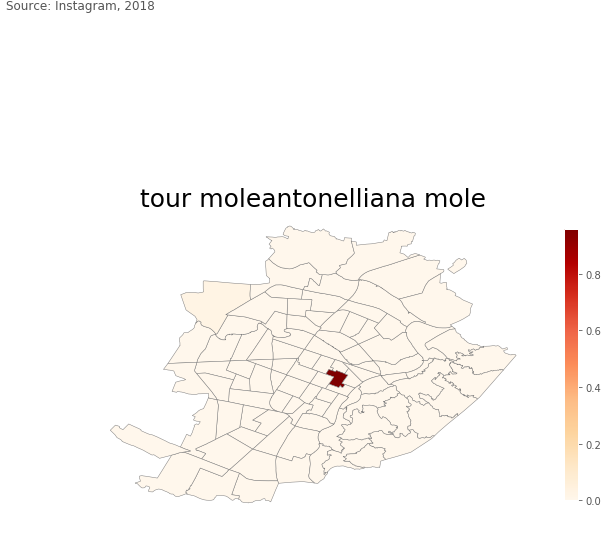

2019-03-08 12:37:44,128 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_moleantonelliana_mole


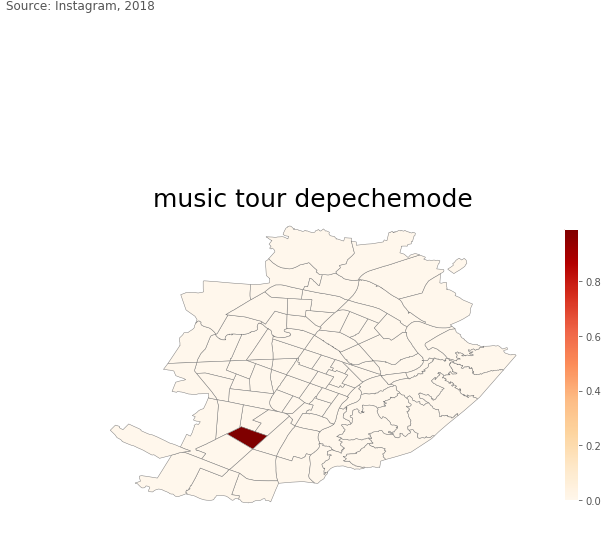

2019-03-08 12:37:46,557 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/music_tour_depechemode


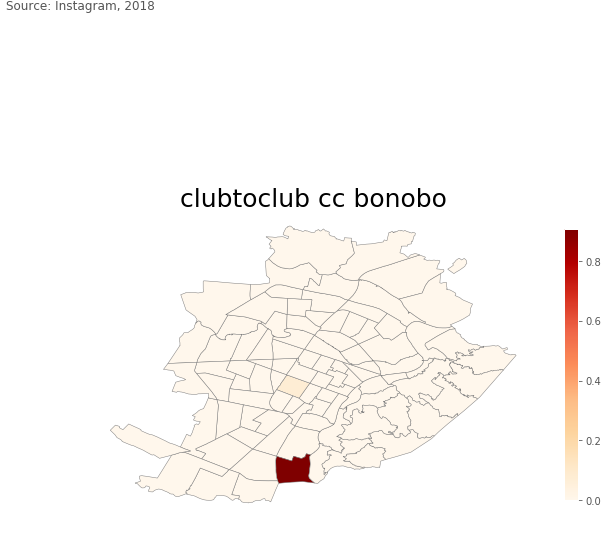

2019-03-08 12:37:48,976 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/clubtoclub_cc_bonobo


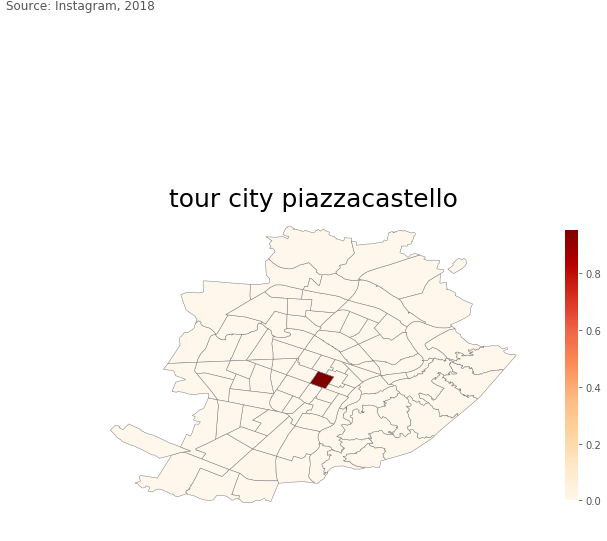

2019-03-08 12:37:51,409 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_city_piazzacastello


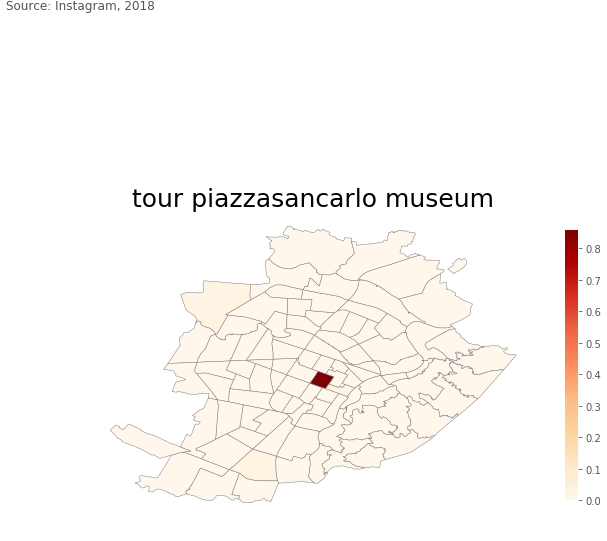

2019-03-08 12:37:53,872 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_piazzasancarlo_museum


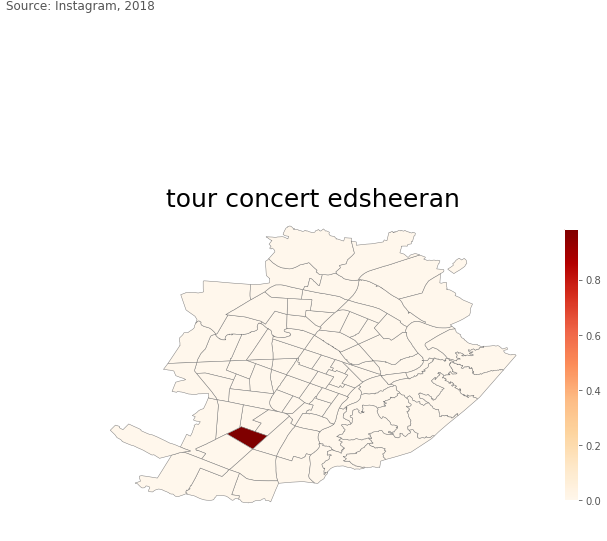

2019-03-08 12:37:56,316 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_concert_edsheeran


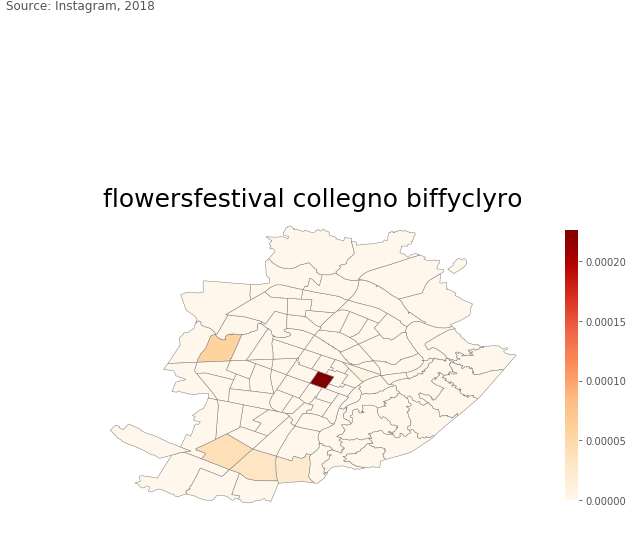

2019-03-08 12:37:58,785 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/flowersfestival_collegno_biffyclyro


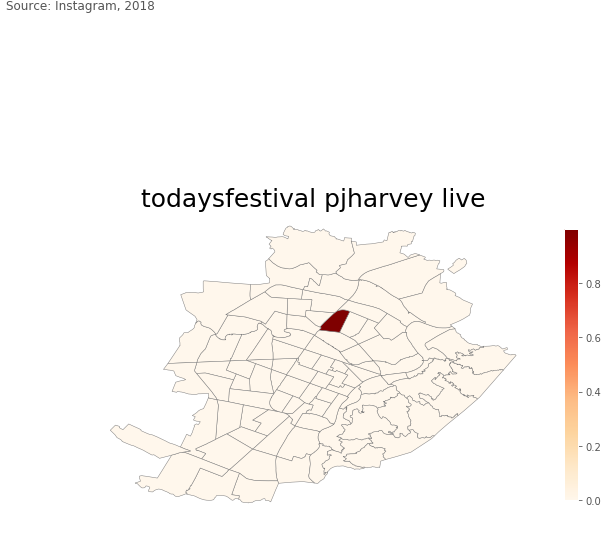

2019-03-08 12:38:01,233 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/todaysfestival_pjharvey_live


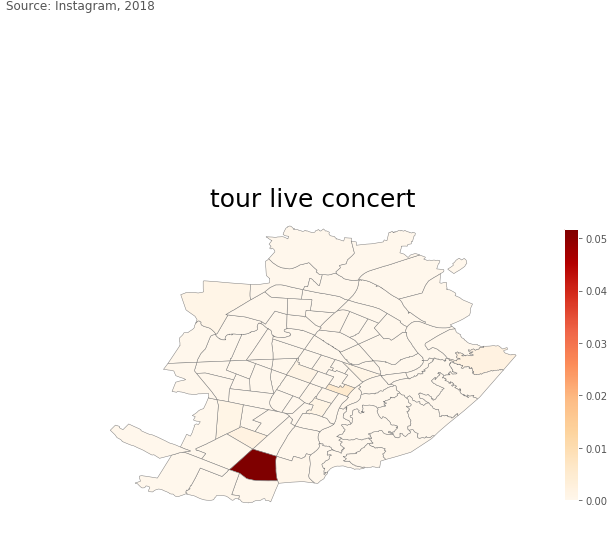

2019-03-08 12:38:03,695 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_live_concert


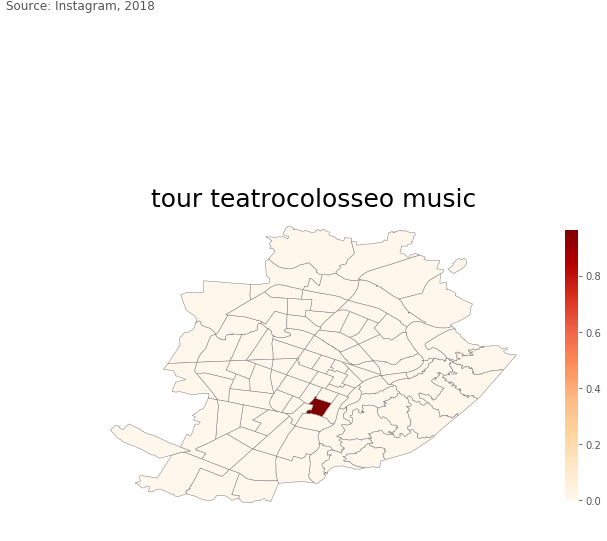

2019-03-08 12:38:06,171 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/tour_teatrocolosseo_music


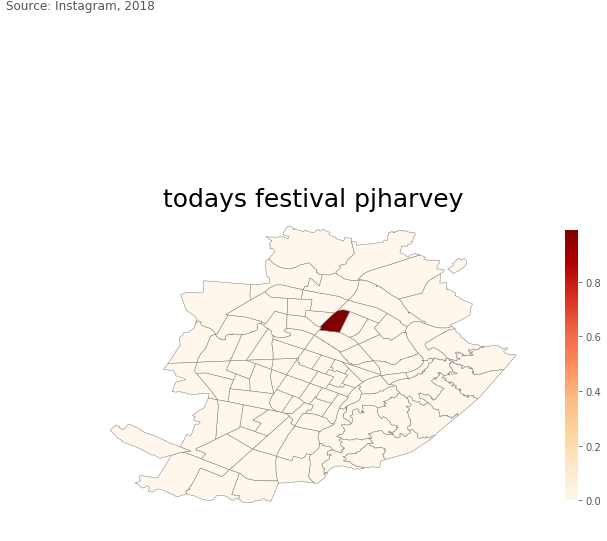

2019-03-08 12:38:08,666 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/todays_festival_pjharvey


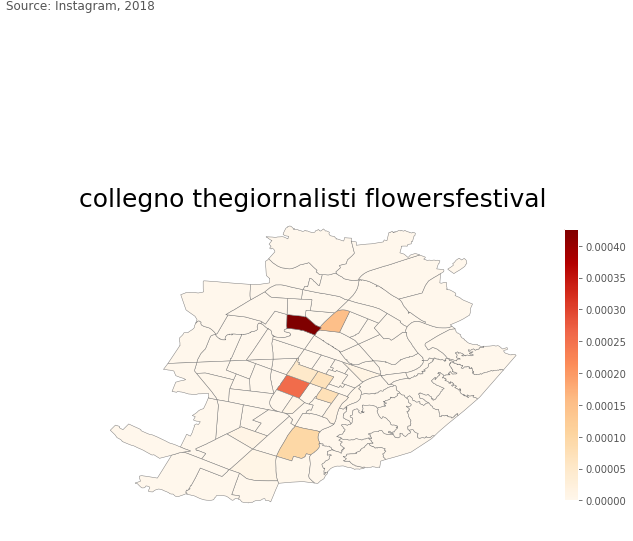

file saved Results/2019-03-08_12_5000_festival_word2vec/Heatmaps_week2018/collegno_thegiornalisti_flowersfestival


In [156]:
reload(IL)
reload(IP)
#msg='Set of Heatmaps made on the 24/01, sampled from April 2013. First run to be made with 17 TV. with Monuments'
#foldername1='Heatmaps_2401_17_spl'
#foldername2='NTF_2401_17_spl'

#Geographical repartition of topics
h24_path=path+'Heatmaps_week{}/'.format(year)
try:
    os.mkdir(h24_path)
except OSError:
    pass
for i in range(0,len(A.T)):
    Coordinates=list(df_classified.index)
    row=A.T[i]
    topic=''
    for j in (0,1,2):
        topic+='_'+TermVectorsIndex[i][j][0]
    #IL.geo_topic(row,Coordinates,i,topic=topic,save=True,folder=path+'Heatmaps/')
    IP.geo_hm_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=True,folder=h24_path,shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')
    #IP.geo_plot_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=True,folder=path+'Heatmaps/',shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')

## Time Series

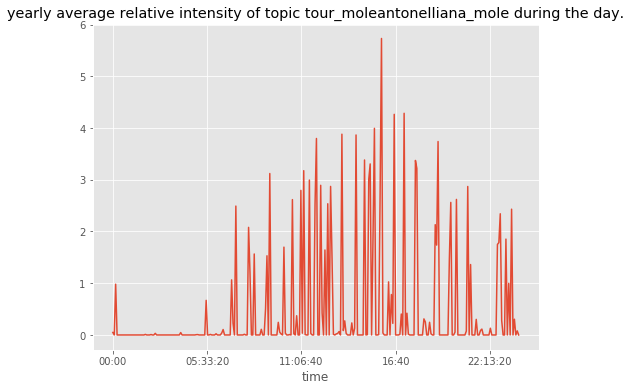

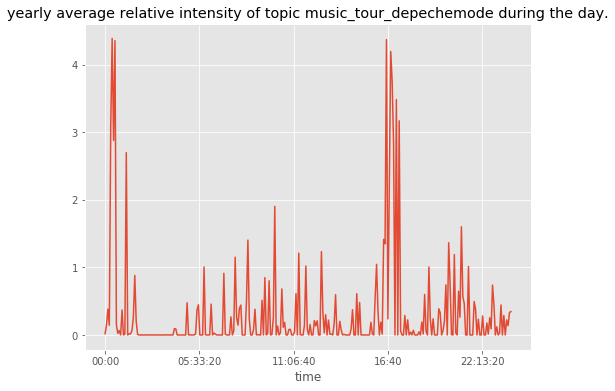

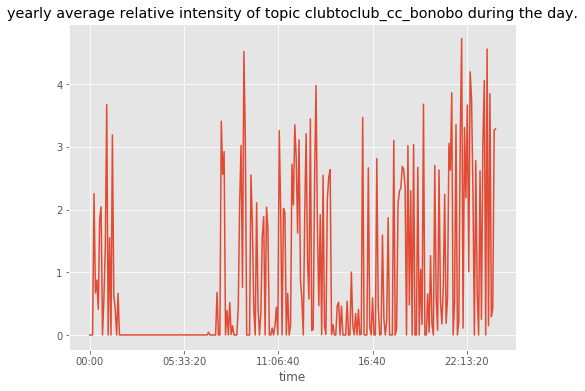

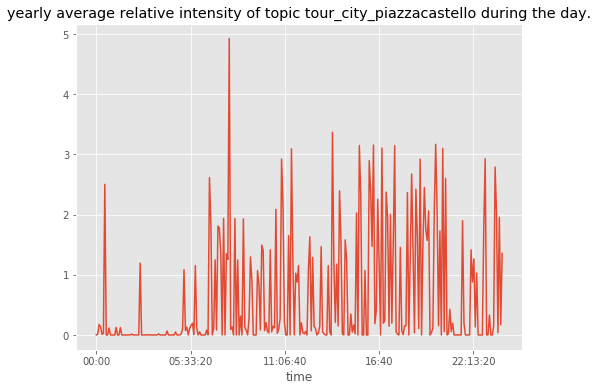

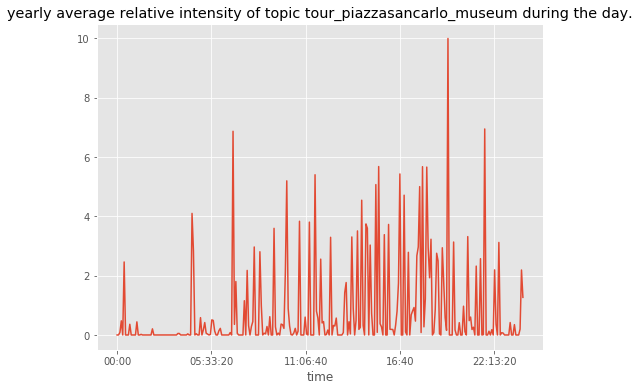

...

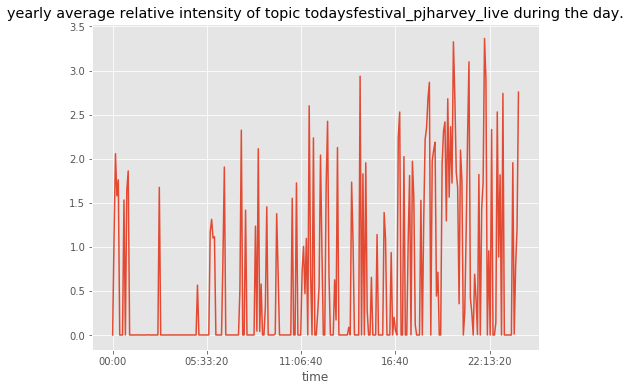

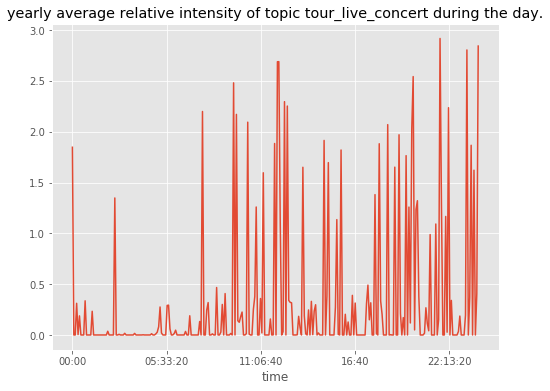

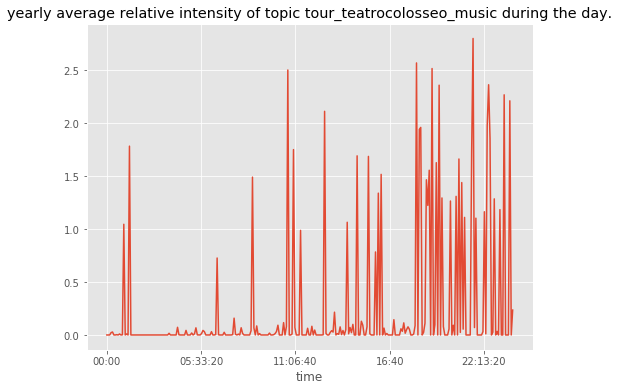

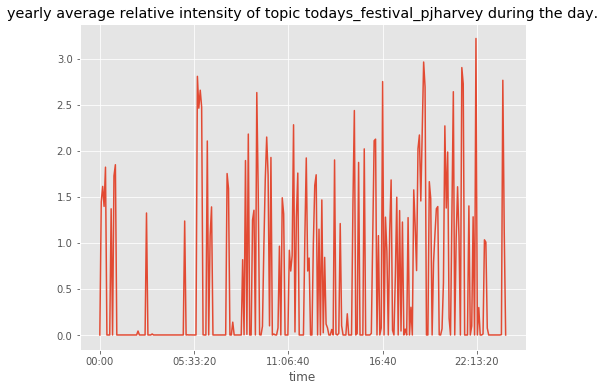

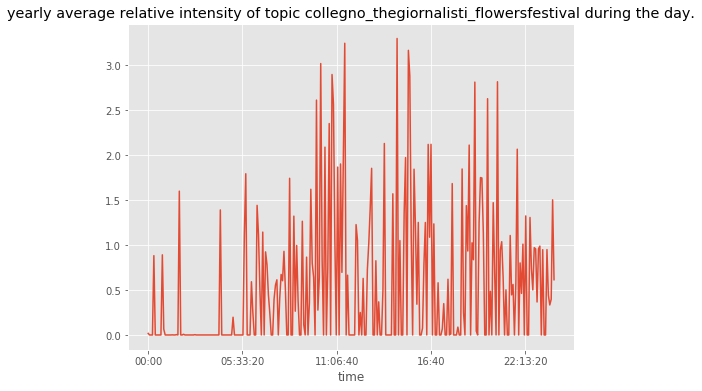

In [157]:
# Plot this only for the yearly 24H averaged
clock=[s.time() for s in df_classified.columns.tolist()[0:-1]]
# Time Series    
seasons=['white', 'mediumseagreen', 'coral', 'gold']
for index in range(0, len(C.T)):
    row=C.T[index]
    topic=''
    for i in (0,1,2):
        topic+=TermVectorsIndex[index][i][0]+'_'
    topic=topic.strip('_')
    plt.figure()
    plt.plot(clock, row[:-1])
#    plt.xticks(flags[flags.index(start)][[f.date().month for f in flags[flags.index(start)]].index(1)::12])
    plt.title('yearly average relative intensity of topic '+topic+' during the day.')
    if True:
        plt.savefig(path+'t_series/week{}_plot_topic_'.format(year)+topic+'.pdf')
    plt.show()

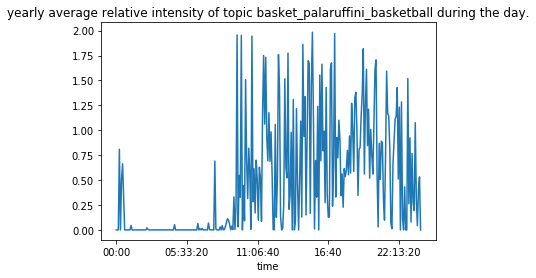

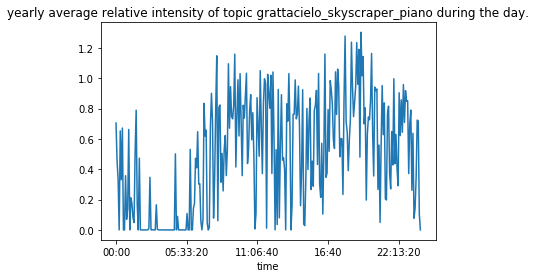

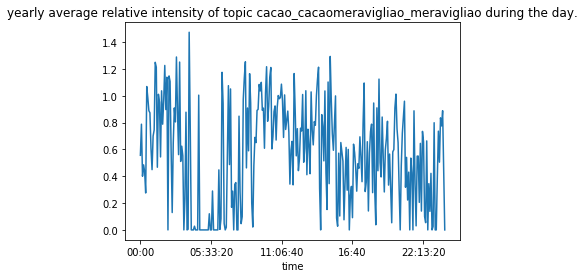

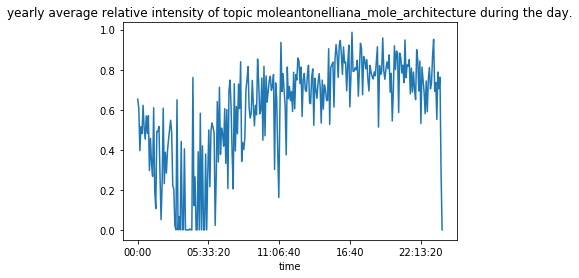

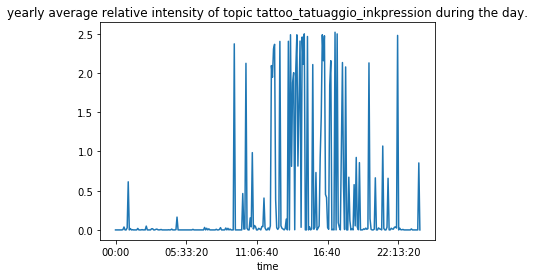

...

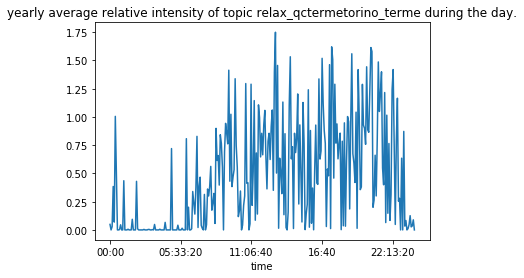

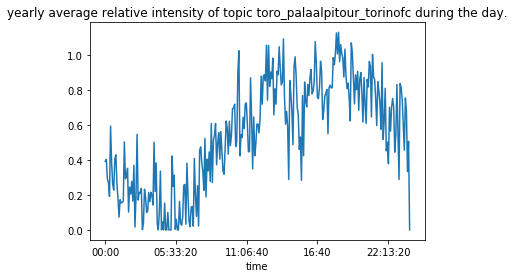

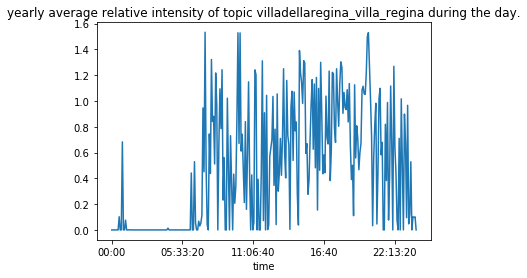

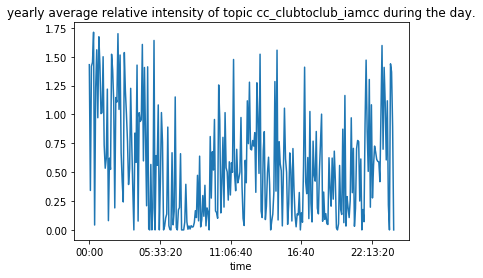

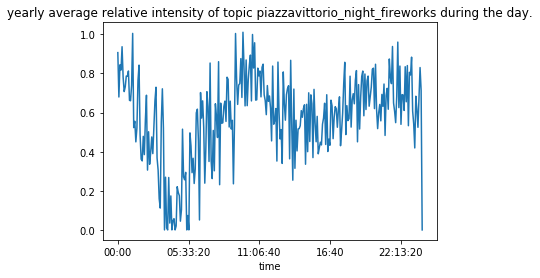

In [108]:
clock=[s.time() for s in df_classified.columns.tolist()[0:-1]]
# Time Series    
seasons=['white', 'mediumseagreen', 'coral', 'gold']
for index in range(0, len(C.T)):
    row=C.T[index]
    topic=''
    for i in (0,1,2):
        topic+=TermVectorsIndex[index][i][0]+'_'
    topic=topic.strip('_')
    plt.figure()
    plt.plot(clock, row)
#    plt.xticks(flags[flags.index(start)][[f.date().month for f in flags[flags.index(start)]].index(1)::12])
    plt.title('yearly average relative intensity of topic '+topic+' during the day.')
    if True:
        plt.savefig(path+'t_series/plot_topic_'+topic+'.pdf')
    plt.show()

# Relative neighbourhoods dynamics

For each shp neighbourhood, add the time series of its belonging bins multiplied by their respective topic vector, normalize and plot.

In [ ]:
path='Results/2019-01-31_8_5000_noMon_festival_word2vec/'
#path='Results/2019-02-06_8_5000/'
#path='Results/2019-02-06_8_5000_spl/'

In [ ]:
#path='todo/torinojazzfestival/'
#path='todo/art/streetart/'
#path='Results/2019-01-30_17_5000_noMon/'
A=pickle.load(open(path+'pickle/A.pkl','r')) #bins/topic
C=pickle.load(open(path+'pickle/C.pkl','r')) #time/topic
B=pickle.load(open(path+'pickle/B.pkl','r')) #words/topic
Grid=pickle.load(open(path+'pickle/Grid.pkl','r'))
TermVectors2=open(path+'TermVectors.txt', 'r').readlines()[::-1]
#tjf=7
#TJF_vec=A.T[tjf]
#Norm=np.sqrt(sum([t*t for t in TJF_vec]))
#TJF_vec=[t/Norm for t in TJF_vec]

In [ ]:
import shapely
from shapely.geometry import Point

In [114]:
Grid=df_toNTF.index.tolist()
#clock=[s.time() for s in df_classified.columns.tolist()[0:-1]]
SHP_ngh=geopandas.read_file('zone_statistiche_geo/zone_statistiche_geo.shp')
#SHP_ngh=geopandas.read_file('microzone_censuarie_geo/microzone_censuarie_geo.shp')
SHP_ngh.crs={'init':'epsg:3003'}
#C_bins=[[j for j,g in enumerate(Grid) if Point((g[1],g[0])).within(SHP_ngh.to_crs(epsg=4326).geometry.iloc[i])] for i in SHP_ngh.index]
#SHP_ngh['bins']=C_bins

2019-03-08 12:22:28,333 : INFO : Failed to auto identify EPSG: 7


In [139]:
clock=df_toNTF.columns.tolist()
clock=[s.time() for s in clock]

In [ ]:
#Build a dict of all bins belonging to a neighbourhood.
dict_ngh_bins={}
for i in SHP_ngh.index:
    dict_ngh_bins[SHP_ngh.ZONASTAT.iloc[i]]=SHP_ngh.bins.iloc[i]
#pickle.dump(dict_ngh_bins, open('dict_ngh_bins.pkl', 'w'))

In [116]:
dict_ngh_bins = pickle.load(open('dict_ngh_bins.pkl', 'r'))

In [158]:
# Build a topic/time matrix for each neighbourhood.
D=[]

#For all zone statistiche
for k in dict_ngh_bins.keys():
    #C shape is n_topics, n_months
    d=np.zeros(C.shape)
    #For all bins in the zone
    for b in dict_ngh_bins[k]:
        #Add to d the topic vector of this bin multiplied by the topic/time matrix
        d+=(A[b]*C)
    #d has shape months x topics
    d_norm=np.array(d)
    for i,row in enumerate(d):
        N=np.sqrt(sum([e**2 for e in row]))
        if N:
            row=[e/N for e in row]
            d_norm[i]=row
        else:
            d_norm[i]=[0 for e in row]
    D.append(d_norm.T)

In [ ]:
name='festival_relatdyn/'
os.mkdir(name)

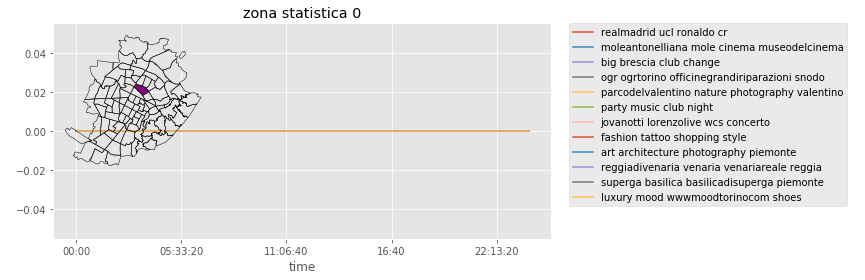

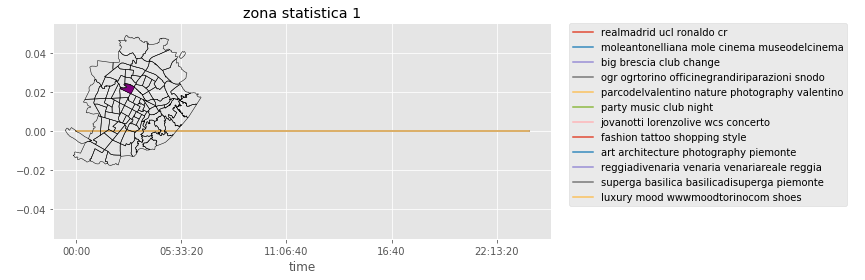

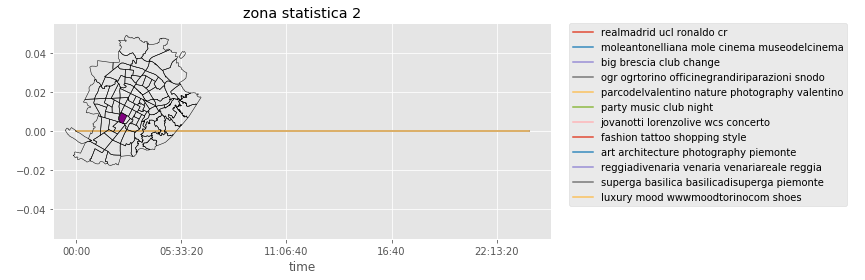

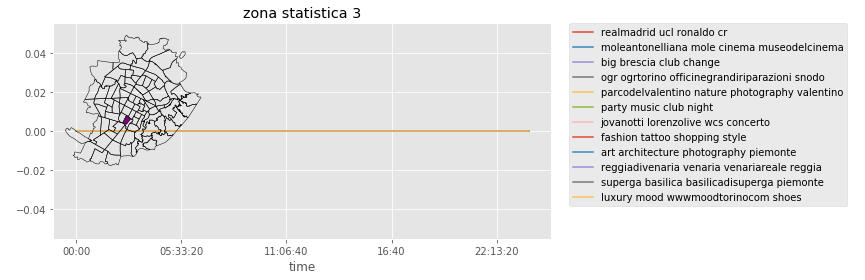

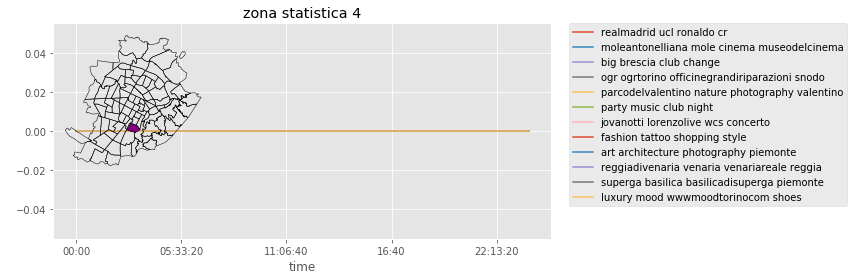

...

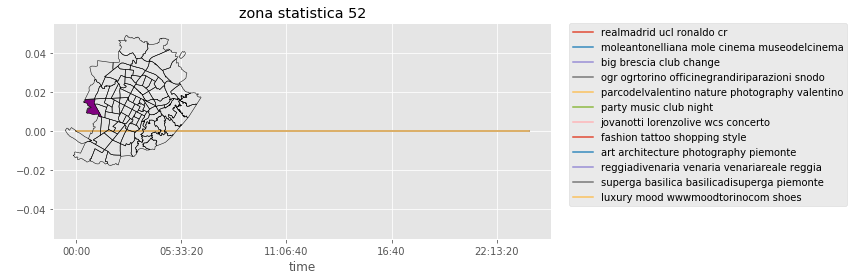

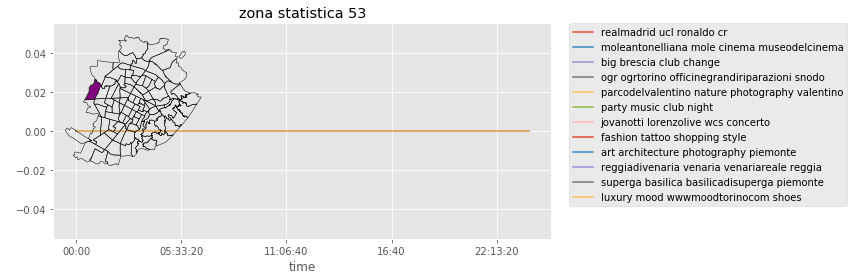

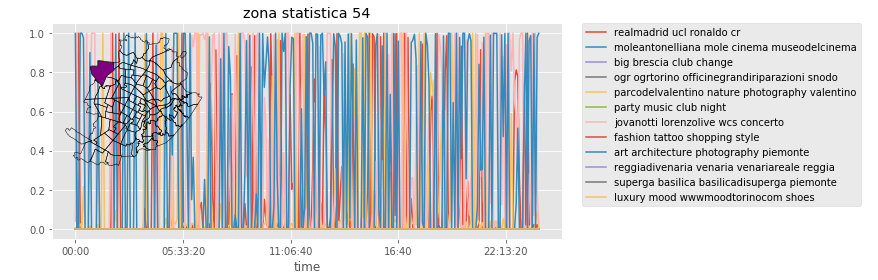

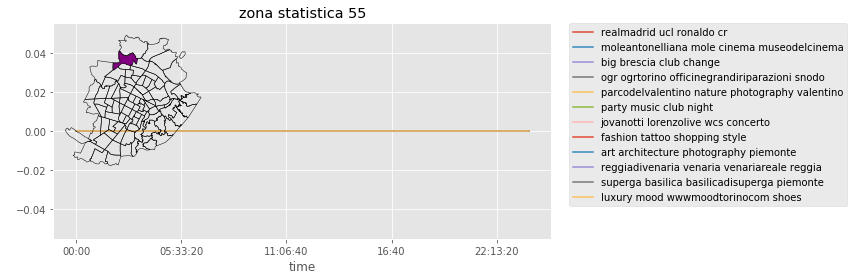

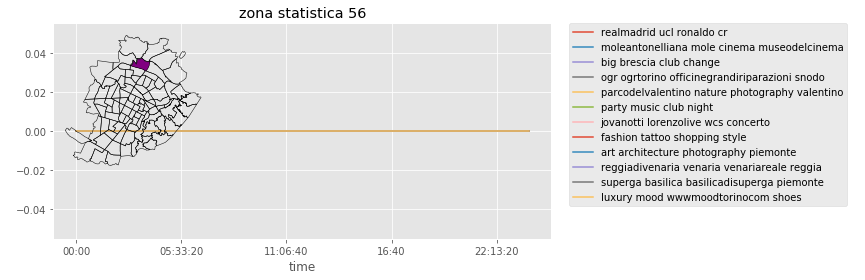

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams["figure.figsize"] = 12,4
plt.style.use('ggplot')

for zona,d in enumerate(D):
    f, (ax1,lax) = plt.subplots(ncols=2, gridspec_kw={"width_ratios":[4,1]})
    ax1.set_title('zona statistica {}'.format(zona))
    axins = inset_axes(ax1, width="30%", height=2, loc=2)
    axins.axis('off')
    for tp,plot in enumerate(d):
        #label=' '.join([t.strip("[u'],") for t in TermVectors2[tp].split(' ')[1:4]])
        label=' '.join([t[0] for t in TermVectors2[tp][0:4]])
        #ax1.plot(clock[len(clock)-len(plot):-1], plot[:-1],label=label)
        ax1.plot(clock, plot[:-1],label=label)
    
    h,l = ax1.get_legend_handles_labels()
    lax.legend(h,l, borderaxespad=0)
    lax.axis("off")
    SHP_ngh.geometry.plot(color=(0,0,0,0),edgecolor='black',ax=axins)
    SHP_ngh.geometry[SHP_ngh.ZONASTAT==dict_ngh_bins.keys()[zona]].plot(color='purple',edgecolor='black',ax=axins)
    plt.tight_layout()
    if False:
        plt.savefig(name+'zona statistica {}'.format(zona)+'.pdf')
    plt.show()
    plt.close()

# Previous trials

In [230]:
reload(IP)
neighbourhoods, relevant_bins_by_ngh=IP.relevant_bins_to_ngbh(TJF_vec, Grid)

2019-02-28 15:00:16,690 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.13555429212443396


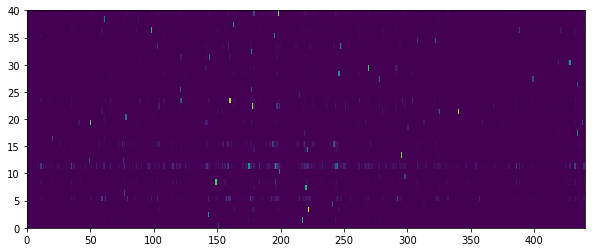

In [237]:
#General Topics Dynamics
n_topics=8
plt.figure(figsize=(10,4))
plt.pcolormesh([c for c in A.T])#, cmap=plt.cm.Greys)
plt.xlim(0,len(A.T[0]))
#plt.savefig('Topic_dynamic.pdf')
#plt.yticks(np.arange(n_topics)+0.5, np.arange(0,n_topics));
#plt.xticks(flags[start:stop])
plt.show()

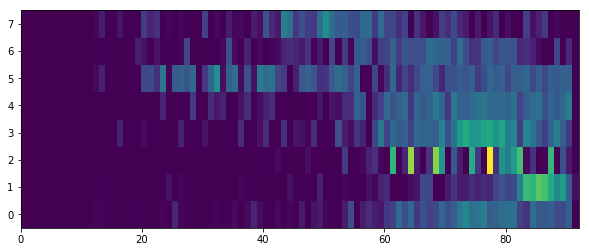

In [233]:
#General Topics Dynamics
n_topics=8
plt.figure(figsize=(10,4))
plt.pcolormesh([c for c in C.T])#, cmap=plt.cm.Greys)
plt.xlim(0,len(C.T[0]))
#plt.savefig('Topic_dynamic.pdf')
plt.yticks(np.arange(n_topics)+0.5, np.arange(0,n_topics));
#plt.xticks(flags[start:stop])
plt.show()

In [154]:
#Build a dictionary of the relevant neighbourhoods for each topic
dict_topic_ngh={}
for r in range(len(TermVectors)):
    #Pick the relevant shapefiles associated to it.
    #topic_vec is the vector associating the intensity of topic r to each bin.
    topic_vec=A.T[r]
    Norm=np.sqrt(sum([t*t for t in topic_vec]))
    topic_vec=[t/Norm for t in topic_vec]
    #Performing OTSU threshold to keep only the relevant bins
    neighbourhoods, relevant_bins_by_ngh=IP.relevant_bins_to_ngbh(topic_vec, Grid)
    dict_topic_ngh[r]=relevant_bins_by_ngh

2019-03-04 16:38:26,520 : INFO : Failed to auto identify EPSG: 7
2019-03-04 16:38:26,852 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019480754348865001


2019-03-04 16:38:27,177 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019391423436318264


2019-03-04 16:38:27,511 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001950948777425248


2019-03-04 16:38:27,837 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.005799506132504622


2019-03-04 16:38:28,161 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019212456695133454


2019-03-04 16:38:28,501 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.04095686842315249


2019-03-04 16:38:28,900 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001939168969996037


2019-03-04 16:38:29,237 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019368929947034326


2019-03-04 16:38:29,583 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.004312496849555961


2019-03-04 16:38:29,927 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019451342275962477


2019-03-04 16:38:30,280 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001936721278191119


2019-03-04 16:38:30,636 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.04862726126277361


2019-03-04 16:38:30,974 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.2893727459015265


2019-03-04 16:38:31,310 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019517354859393153


2019-03-04 16:38:31,667 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.013071073814184622


2019-03-04 16:38:32,001 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.061284958957880276


2019-03-04 16:38:32,331 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0007456052968061978


2019-03-04 16:38:32,653 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.00038225172957428934


2019-03-04 16:38:32,987 : INFO : Failed to auto identify EPSG: 7


otsu threshold 7.5374892271321425e-06


2019-03-04 16:38:33,323 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.01230348416044312


2019-03-04 16:38:33,651 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.005757935584274838


2019-03-04 16:38:34,003 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019320754049486552


2019-03-04 16:38:34,360 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.024026491232579557


2019-03-04 16:38:34,701 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.15041425655058868


2019-03-04 16:38:35,044 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019373539365749443


2019-03-04 16:38:35,415 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0011646883399985457


2019-03-04 16:38:35,751 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0002762039747420637


2019-03-04 16:38:36,094 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009625813322102692


2019-03-04 16:38:36,438 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.005678071282342006


2019-03-04 16:38:36,807 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009594168714821657


2019-03-04 16:38:37,144 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.00022673703059638092


2019-03-04 16:38:37,472 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.08010415173366797


2019-03-04 16:38:37,797 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019400202565784128


2019-03-04 16:38:38,128 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.07874120625474718


2019-03-04 16:38:38,459 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009590851213213994


2019-03-04 16:38:38,789 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019327975811264451


2019-03-04 16:38:39,133 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.05909894527687293


2019-03-04 16:38:39,510 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019503196572679988


2019-03-04 16:38:39,846 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009624023129983166
otsu threshold 0.04915280251330622


In [183]:
#And a dict of relevant topics for each ngh
dict_ngh_topic={}


#For each ngh that 'lit up' in the computation, create an entry
for r in dict_topic_ngh.keys():
    for ngh in dict_topic_ngh[r].keys():
        dict_ngh_topic[ngh]=[]
        
        
for r in range(len(TermVectors)):
    #List the relevant neighbourhoods
    ngh_topic=dict_topic_ngh[r].keys()
    for ngh in ngh_topic:
        #This neighbourhoods is relevant for the topic r
        dict_ngh_topic[ngh]+=[r]

2019-03-04 17:15:35,226 : INFO : Failed to auto identify EPSG: 7
2019-03-04 17:15:35,642 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019480754348865001


2019-03-04 17:15:36,010 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019391423436318264


2019-03-04 17:15:36,362 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001950948777425248


2019-03-04 17:15:36,689 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.005799506132504622


2019-03-04 17:15:37,129 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019212456695133454
otsu threshold 0.04095686842315249


2019-03-04 17:15:37,810 : INFO : Failed to auto identify EPSG: 7
2019-03-04 17:15:38,255 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001939168969996037


2019-03-04 17:15:38,646 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019368929947034326


2019-03-04 17:15:39,006 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.004312496849555961


2019-03-04 17:15:39,398 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019451342275962477


2019-03-04 17:15:39,757 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.001936721278191119


2019-03-04 17:15:40,196 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.04862726126277361


2019-03-04 17:15:40,610 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.2893727459015265


2019-03-04 17:15:40,997 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019517354859393153


2019-03-04 17:15:41,352 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.013071073814184622


2019-03-04 17:15:41,801 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.061284958957880276


2019-03-04 17:15:42,295 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0007456052968061978


2019-03-04 17:15:42,660 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.00038225172957428934
otsu threshold 7.5374892271321425e-06


2019-03-04 17:15:43,554 : INFO : Failed to auto identify EPSG: 7
2019-03-04 17:15:43,966 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.01230348416044312
otsu threshold 0.005757935584274838


2019-03-04 17:15:44,503 : INFO : Failed to auto identify EPSG: 7
2019-03-04 17:15:44,852 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019320754049486552


2019-03-04 17:15:45,238 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.024026491232579557


2019-03-04 17:15:45,586 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.15041425655058868


2019-03-04 17:15:46,010 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019373539365749443


2019-03-04 17:15:46,394 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0011646883399985457


2019-03-04 17:15:46,805 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0002762039747420637


2019-03-04 17:15:47,196 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009625813322102692


2019-03-04 17:15:47,547 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.005678071282342006


2019-03-04 17:15:47,949 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009594168714821657


2019-03-04 17:15:48,342 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.00022673703059638092


2019-03-04 17:15:48,685 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.08010415173366797


2019-03-04 17:15:49,022 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019400202565784128


2019-03-04 17:15:49,458 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.07874120625474718


2019-03-04 17:15:49,863 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009590851213213994


2019-03-04 17:15:50,234 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019327975811264451


2019-03-04 17:15:50,601 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.05909894527687293


2019-03-04 17:15:50,963 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.0019503196572679988


2019-03-04 17:15:51,460 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.009624023129983166
otsu threshold 0.04915280251330622


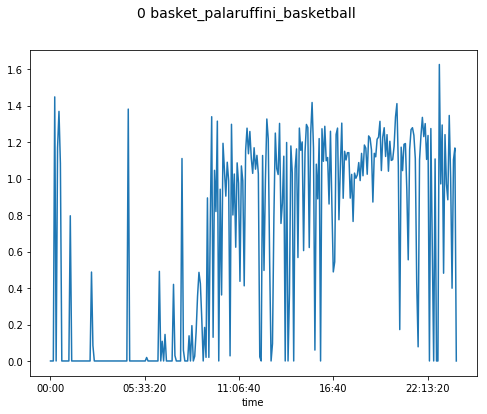

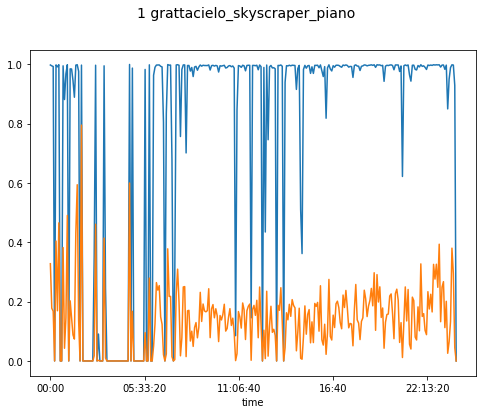

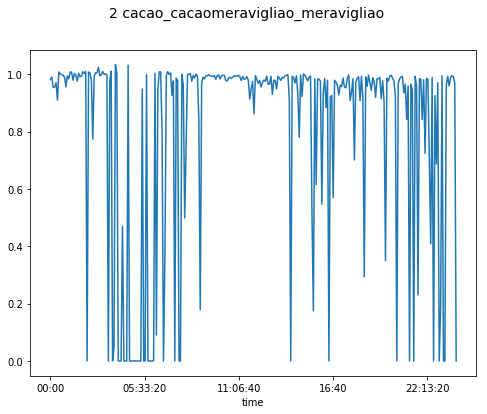

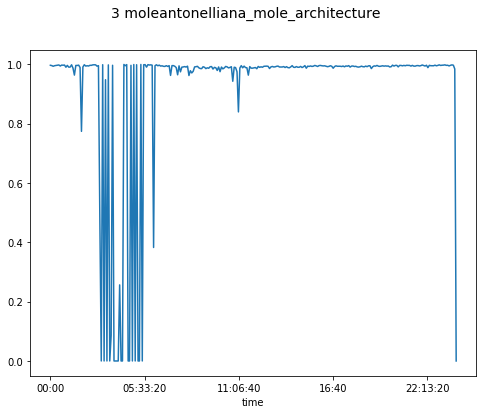

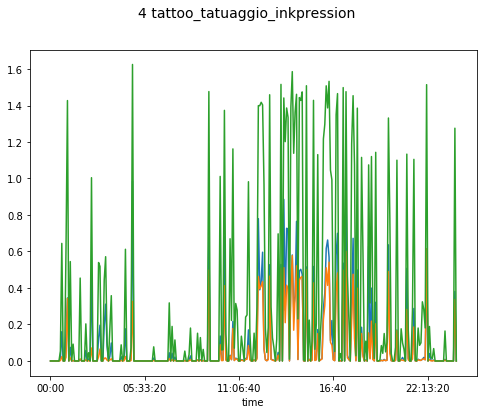

...

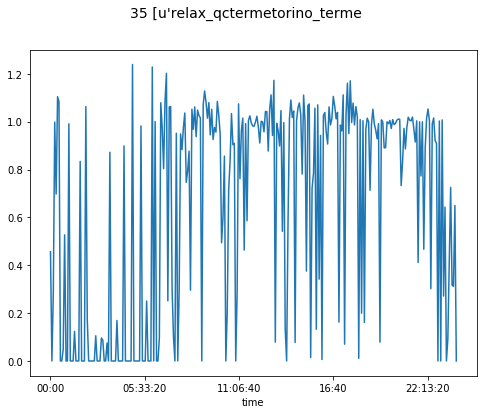

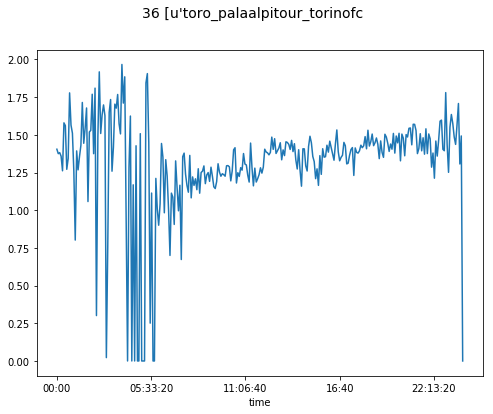

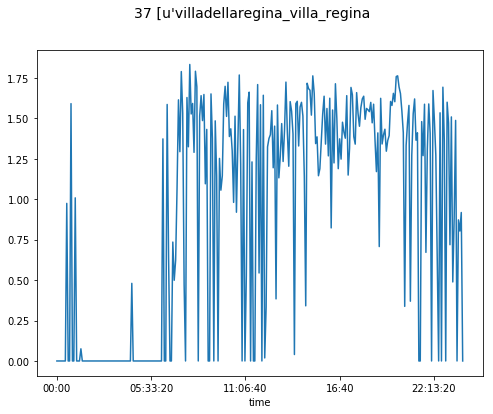

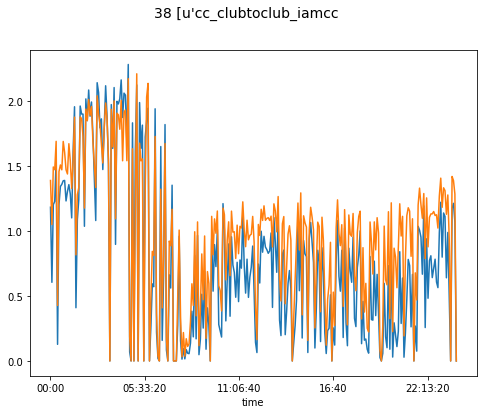

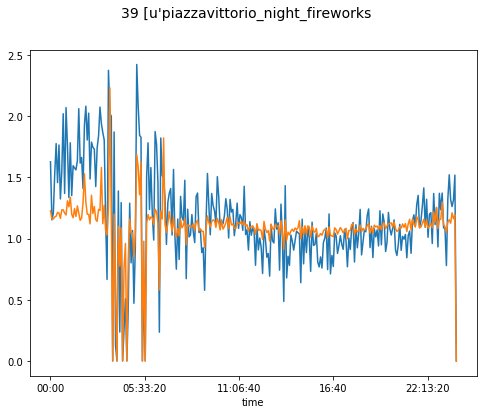

In [235]:
#for each topic:
for r in range(len(TermVectors)):
    #Pick the relevant shapefiles associated to it.
    #topic_vec is the vector associating the intensity of topic r to each bin.
    topic_vec=A.T[r]
    Norm=np.sqrt(sum([t*t for t in topic_vec]))
    topic_vec=[t/Norm for t in topic_vec]
    #Performing OTSU threshold to keep only the relevant bins
    neighbourhoods, relevant_bins_by_ngh=IP.relevant_bins_to_ngbh(topic_vec, Grid)
    
    #f, axes=plt.subplots(len(relevant_bins_by_ngh.keys()),1,sharey=True,sharex=True,squeeze=False)
    f, axes=plt.subplots(1,1,sharey=True,sharex=True,squeeze=False)    
    f.suptitle(str(r)+' '+'_'.join([s.strip("u,\'") for s in TermVectors[r][3:-3].split(' ')[0:3]]),fontsize=14)
    #For all shapefiles relevant to this topic
    for ngh_index, ngh in enumerate(relevant_bins_by_ngh.keys()):
        #for all bins in a given shapefile:
        bins=relevant_bins_by_ngh[ngh][1:]
#        bins=bins[1:]
        if len(bins)==1:
            C_Norm=[neighbourhood_relative_dynamics(A[bins[0]],C)]
        else:
            C_Norm=[neighbourhood_relative_dynamics(A[j],C) for j in bins]
        #For all topics
        #print(TermVectors[r])
        #Plot the topic vector associated to this very neighbourhood shapefile:
        ngh_plot=[sum([b[i] for b in [c[r] for c in C_Norm]]) for i in range(C_Norm[0].shape[1])]
        #axes[ngh_index,0].plot([abs_to_yearmonth(i,[j for j in range(2010,2018)],1) for i in range(len(C_Norm[0][0]))], ngh_plot)
        #axes[ngh_index,0].set_title(ngh)
        axes[0,0].plot(clock, ngh_plot)

        #f.tight_layout()

In [269]:
def neighbourhood_relative_dynamics(row, C):
    # multiply each neighbourhood topic vector by the topic dynamic matrix
    #row=[sum([c[i] for c in rows]) for i in range(len(rows[0]))]
    C_Q=C*row
    C_Q=C_Q.T
    
    #Normalize to represent the relative importance of each topic
    C_Q_Norm=[]
    for i in range(C_Q.T.shape[0]):
        C_row=C_Q.T[i]
        N=np.sqrt(sum([r**2 for r in C_row]))
        if not N==0:
            C_row=[r/N for r in C_row]
        C_Q_Norm.append(C_row)
    return np.array(C_Q_Norm).T

In [268]:
dict_topic_ngh[0]

{65: [<shapely.geometry.polygon.Polygon at 0x7f062203c190>,
  69,
  70,
  82,
  94,
  95,
  113,
  134,
  135,
  151]}

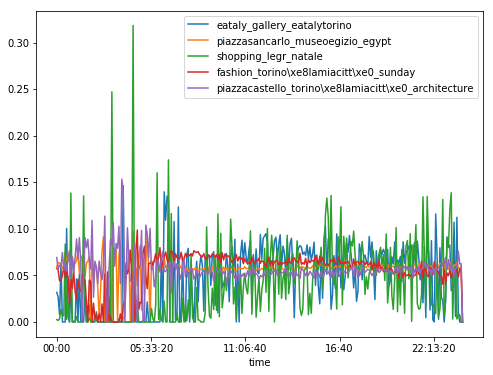

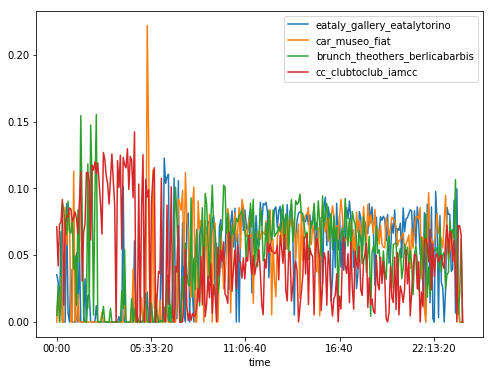

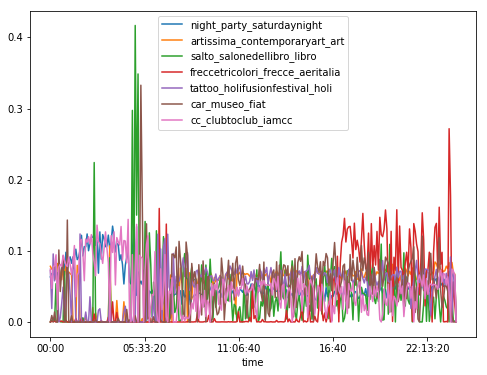

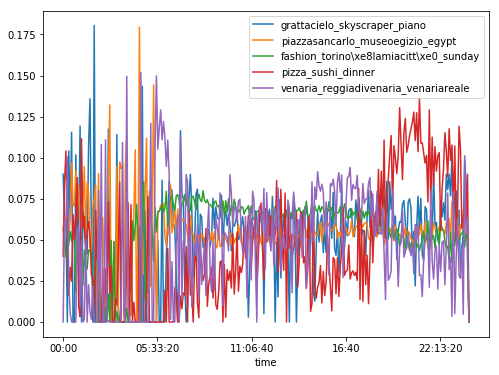

In [280]:
#for each neighbourhood shapefile:

for ngh in dict_ngh_topic.keys():
    relevant_topics=dict_ngh_topic[ngh]
    if len(relevant_topics)<4:
        continue
    #for all bins in this neighbourhood:
    bins=[]
    for r in relevant_topics:
        list_bins=dict_topic_ngh[r].values()
        for l in list_bins:
            l=l[1:]
            while(l):
                b=l.pop(0)
                bins+=[b]
    
    #C_Norms represents the sum of time series for all bins belonging to a shp-neighbourhood, for 
    if len(bins)==1:
        C_Norm=[neighbourhood_relative_dynamics(A[bins[0]],C)]
    else:
        C_Norm=[neighbourhood_relative_dynamics(A[j],C) for j in bins]
    #For all topics
    #f, axes=plt.subplots(min(len(relevant_topics),4),len(relevant_topics)/4+1,sharey=True,sharex=True,squeeze=False)
    #f.suptitle('Neighbourhood {}'.format(ngh),fontsize=14)
    plt.figure()
    for index,r in enumerate(relevant_topics):
        #print(TermVectors[r])
        #Plot the topic vector associated to this very neighbourhood shapefile:
        ngh_plot=[sum([b[i] for b in [c[r] for c in C_Norm]]) for i in range(C_Norm[0].shape[1])]
        Norm=np.sqrt(sum([n**2 for n in ngh_plot]))
        ngh_plot=[n/Norm for n in ngh_plot]
        plt.plot(clock, ngh_plot)
    plt.legend(['_'.join([s.strip("u,\'") for s in TermVectors[r][3:-3].split(' ')[0:3]]).strip("[u'") for r in relevant_topics])
#        axes[index%4, index/4].plot(clock, ngh_plot)
#        axes[index%4, index/4].set_title('_'.join([s.strip("u,\'") for s in TermVectors[r][3:-3].split(' ')[0:3]]))
    #f.tight_layout()

In [275]:
'_'.join([s.strip("u,\'") for s in TermVectors[r][3:-3].split(' ')[0:3]])

'venaria_reggiadivenaria_venariareale'

# JSON for visualisation

In [18]:
import json

data = {'topics':{}, 'bbox':{}, 'grid':{}, 'activity':{},
}

topics={}
TermVectors=open('todo/torinojazzfestival/TermVectors.txt', 'r').readlines()
TermVectors=[t[3:-1].split(' ')[0:3] for t in TermVectors]
for i,t in enumerate(TermVectors):
    topics[str(i)]=[w[2:-2] for w in t]
data['topics'] = topics

lats=sorted(set([s[0] for s in Grid]))
lons=sorted(set([s[1] for s in Grid]))
data['bbox']=[min(lons),min(lats),max(lons),max(lats)]

def grid_to_index(Grid):
    lats=sorted(set([s[0] for s in Grid]))
    lons=sorted(set([s[1] for s in Grid]))
    size=[len(lats), len(lons)]
    grid2=[(lats.index(s[0]),lons.index(s[1])) for s in Grid]
    return size, [s[0]*size[0]+s[1] for s in grid2]

size,indices = grid_to_index(Grid)
data['grid']=size

In [19]:
#convert coordinates to index: nrows*ncol+ncol
coords_indices= [d[1] for d in relevant_bins_by_ngh.values()]

In [20]:
timestamps=[]
for i in range(len(C_Q1_Norm.T)):
    s=IL.abs_to_yearmonth(i,[i for i in range(2010,2018)])
    s=s.timestamp()
    timestamps.append(s)

In [58]:
coords_bins=grid_to_index(Grid)[1]

activity={}

all_neighbourhoods=[neighbourhood_relative_dynamics(A[ic], C) for ic in range(len(coords_bins))]

for i,t in enumerate(timestamps):
    #For each timestep
    for ic, index in enumerate(coords_bins):
        #For each coordinates, take the corresponding 
        topics_intensities=all_neighbourhoods[ic].T[i]
        #topics_int = [1,2,3,4,5] intensities at time t
        local_dict={}
        for to,tp in enumerate(topics_intensities):
            local_dict[str(to)]=tp
        try:
            activity[str(int(t))][str(index)]=local_dict
        except KeyError:
            activity[str(int(t))]={str(index):local_dict}
data['activity']=activity

In [67]:
data['bbox']

[7.576453909502152, 45.00449999999999, 7.767617590986647, 45.1395]

In [68]:
json.dump(data,open('JSON_Torino_seed_festival.json', 'wb'))

In [35]:
data=json.load(open('try1.json', 'rb'))

In [36]:
data.keys()

[u'topics', u'grid', u'bbox', u'activity']

# NMF

In [ ]:
import scipy.io
from sklearn.feature_extraction.text import TfidfTransformer
from scipy.io import savemat
n_features=1000
n_topics=10

list_reviews_all=df_new['text'].tolist()
counts = vectorizer_s.fit_transform(list_reviews_all)
vectorizer_new = CountVectorizer(max_df=0.95, max_features=n_features,stop_words=all_stopwords_add,vocabulary=vectorizer_s.vocabulary_)
ct=0

# For each month in the dataset, get a snapshot view of the NMF tensor:
for month in range(1,(len(list_years)-1)*12+2,3):
    
    year_start=list_years[0]+ int(month/12)
    month_start=month%12  
    year_end=list_years[0]+ int(month+11-0.5)/12
    month_end=1+(month+11-1)%12
    
    try:
        list_reviews_rest=dataframe_collection[str(year_start) + '-' + str(month_start)]['text'].tolist()
    except KeyError:
        continue
        
    # Learn the vocabulary dictionary and return term-document matrix.
    counts = vectorizer_new.fit_transform(list_reviews_rest)
    
    #Transform a count matrix to a normalized tf-idf representation. 
    #(mainly =Terms with frequencies too hi or lo are removed)
    tfidf = TfidfTransformer().fit_transform(counts)
    
    #Save the data in matlab friendly format
    savemat('Inst500Matr' + str(ct), {'tfidf':tfidf})
    
    
    nmf = decomposition.NMF(n_components=n_topics)
    
    #We are looking for two matrices whose product approximates tfidf.
    
    # Learn the model (parameters etc.). I.e "take a look at what we have". returns nothing.
    W = nmf.fit(tfidf)
    
    # dictionary (factorization matrix)
    H = nmf.components_
    
    # Extracts the data and performs NMF on the tfidf-treated dataset. 
    # Returns the matrix W (the weight matrix), to be multiplied by the matrix H (dictionary) to get target tfidf.
    X2 = nmf.fit_transform(tfidf)
    ct=ct+1
    feature_names = vectorizer_new.get_feature_names()
    print month
    for i,text_topic in enumerate(X2.T):
        
        # i.e -> i, [content of column i of X2]
        # i-th topic named text_topic
        # Why sort them backwards?
        text_top = text_topic.argsort()[:-21:-1]
        word_top = nmf.components_[i].argsort()[:-11:-1]
        
        # For each text topic in the NMF resulting list, print the weight vector and the term vector.
        print [nmf.components_[i,k] for k in nmf.components_[i].argsort()[:-11:-1]]
        print [", ".join([feature_names[i] for i in word_top])]
        
        # print the amount of non-zero components in the weight vector
        l=[text_topic[i] for i in text_top]
        print np.count_nonzero(l)
            